In [1]:
# general imports
import sys
import os.path
import warnings
import time

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn.functional as F
import torchvision.datasets as datasets
import torch.optim as optim
import torchvision.transforms as transforms

import numpy as np

In [2]:
sns.set()
warnings.filterwarnings("ignore")

In [9]:
###########################################################################################################
# Data Preparation
###########################################################################################################

cifar_data_path = "../../../data"

# transform
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
trainset = datasets.CIFAR10(root=cifar_data_path, train=True, download=True, transform=transform)
testset = datasets.CIFAR10(root=cifar_data_path, train=False, download=True, transform=transform)

# train data
train_labels = np.array(trainset.train_labels)

# test data
test_labels = np.array(testset.test_labels)

Files already downloaded and verified
Files already downloaded and verified


In [6]:
###############################################################################
# Different CNN Architectures
###############################################################################


class SimpleCNNOneFilter(torch.nn.Module):

    def __init__(self):
        super(SimpleCNNOneFilter, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 1, kernel_size=10, stride=2)
        self.fc1 = torch.nn.Linear(144, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = x.view(-1, 144)
        x = self.fc1(x)
        return(x)


class SimpleCNN32Filter(torch.nn.Module):

    def __init__(self):
        super(SimpleCNN32Filter, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 32, kernel_size=10, stride=2)
        self.fc1 = torch.nn.Linear(144*32, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = x.view(-1, 144*32)
        x = self.fc1(x)
        return(x)


class SimpleCNN32Filter2Layers(torch.nn.Module):

    def __init__(self):
        super(SimpleCNN32Filter2Layers, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 32, kernel_size=10, stride=2)
        self.conv2 = torch.nn.Conv2d(32, 32, kernel_size=7, stride=1)
        self.fc1 = torch.nn.Linear(36*32, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(-1, 36*32)
        x = self.fc1(x)
        return(x)


class BestCNN(torch.nn.Module):
    def __init__(self):
        super(BestCNN, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 6, 5)
        self.pool = torch.nn.MaxPool2d(2, 2)
        self.conv2 = torch.nn.Conv2d(6, 16, 5)
        self.fc1 = torch.nn.Linear(16 * 5 * 5, 120)
        self.fc2 = torch.nn.Linear(120, 84)
        self.fc3 = torch.nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [35]:
def cnn_train_test(cnn_model, y_train, y_test, fraction_of_train_samples, config, class1=3, class2=5, plot=True):
    # set params
    num_epochs = config["epochs"]
    learning_rate = config["lr"]
    batch_size = config["batch_size"]
    momentum = config["momentum"]

    class1_indices = np.argwhere(y_train == class1).flatten()
    class1_indices = class1_indices[:int(len(class1_indices) * fraction_of_train_samples)]
    class2_indices = np.argwhere(y_train == class2).flatten()
    class2_indices = class2_indices[:int(len(class2_indices) * fraction_of_train_samples)]
    train_indices = np.concatenate([class1_indices, class2_indices])

    train_sampler = torch.utils.data.sampler.SubsetRandomSampler(train_indices)
    train_loader = torch.utils.data.DataLoader(
        trainset, batch_size=batch_size, num_workers=2, sampler=train_sampler)

    test_indices = np.concatenate(
        [np.argwhere(y_test == class1).flatten(), np.argwhere(y_test == class2).flatten()])
    test_sampler = torch.utils.data.sampler.SubsetRandomSampler(test_indices)

    test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                              shuffle=False, num_workers=2, sampler=test_sampler)

    # define model
    net = cnn_model()

    # loss and optimizer
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=learning_rate, momentum=momentum)

    train_losses = list()
    for epoch in range(num_epochs):  # loop over the dataset multiple times

        for i, data in enumerate(train_loader, 0):
            # get the inputs
            inputs, labels = data

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            train_losses.append(loss.item())

            loss.backward()
            optimizer.step()

    # test the model
    correct = 0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            images, labels = data
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels.view(-1)).sum().item()
    accuracy = float(correct) / float(total)
    
    if plot:
        # plot the losses
        plt.plot(train_losses)
        plt.show()
    
    return accuracy

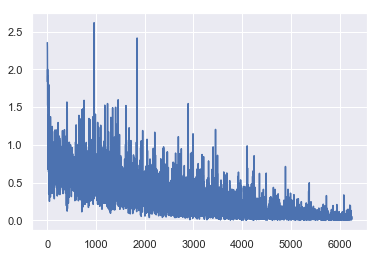

0.6125

In [40]:
# test code
cnn_config = {"epochs": 25, "lr": 0.001, "batch_size": 4, "momentum": 0.9}
cnn_train_test(SimpleCNN32Filter, train_labels, test_labels, 0.1, cnn_config, 3, 5)

In [45]:
# search space
epochs_space = [1, 5, 10, 15, 20, 25]
lr_space = [0.01, 0.001, 0.0001, 0.00001]
batch_size_space = [4, 8, 16, 32, 64]
momentum_space = [0.5, 0.9, 0.95, 0.99]

Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


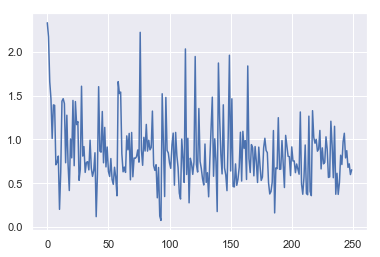

Accuracy 0.5545
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


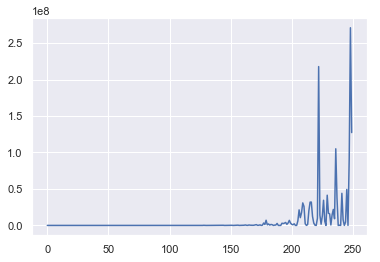

Accuracy 0.562
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


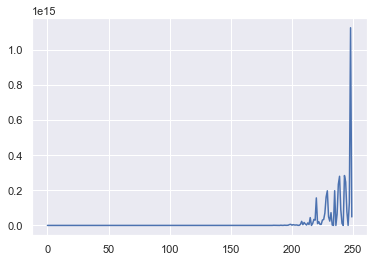

Accuracy 0.5475
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


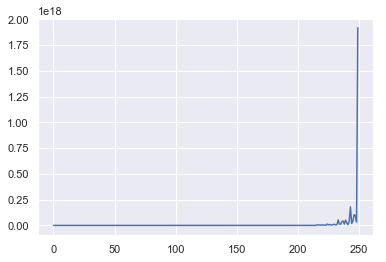

Accuracy 0.4735
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


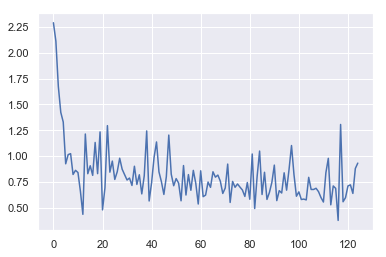

Accuracy 0.588
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


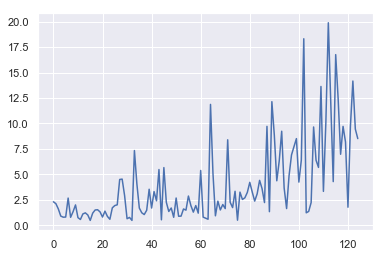

Accuracy 0.518
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


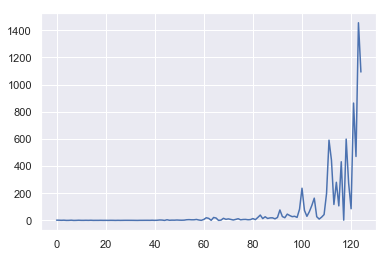

Accuracy 0.5335
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


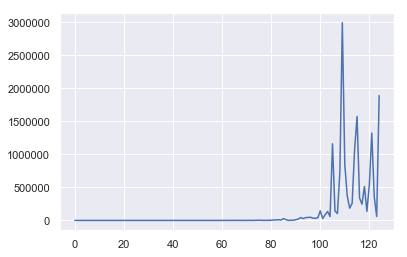

Accuracy 0.4735
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


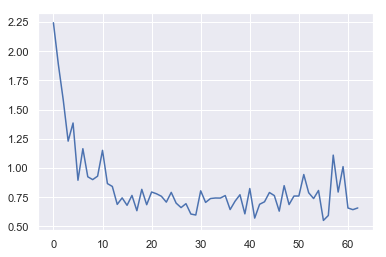

Accuracy 0.572
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


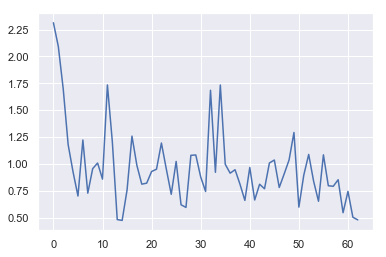

Accuracy 0.5645
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


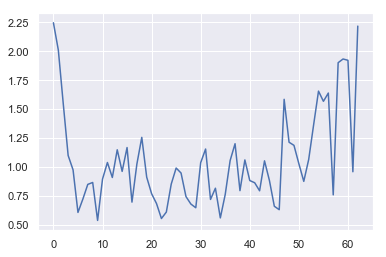

Accuracy 0.5335
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


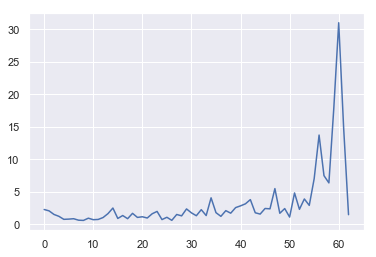

Accuracy 0.5315
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


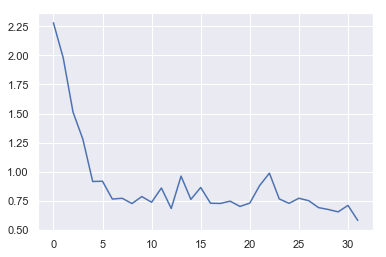

Accuracy 0.557
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


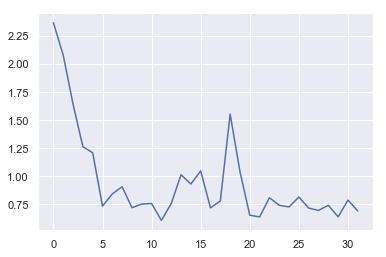

Accuracy 0.561
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


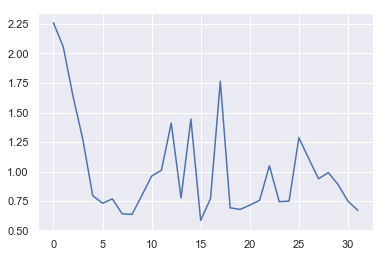

Accuracy 0.547
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


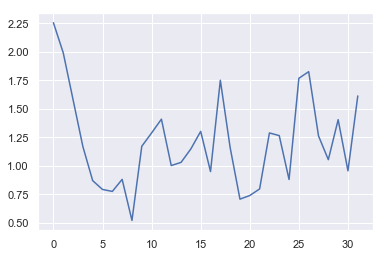

Accuracy 0.5085
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


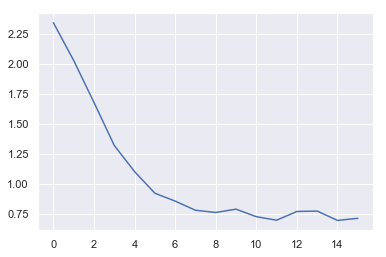

Accuracy 0.56
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


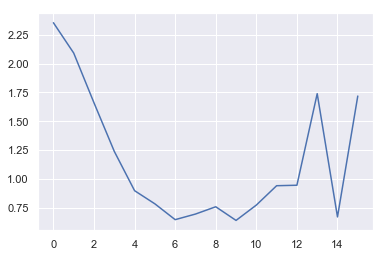

Accuracy 0.5555
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


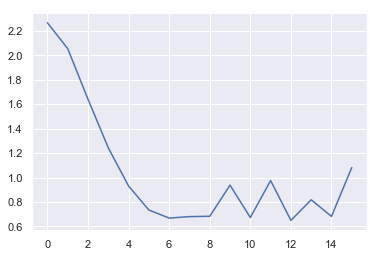

Accuracy 0.6045
Experiment {'epochs': 1, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


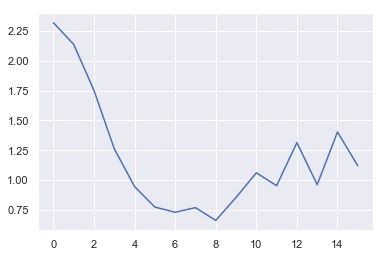

Accuracy 0.5165
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


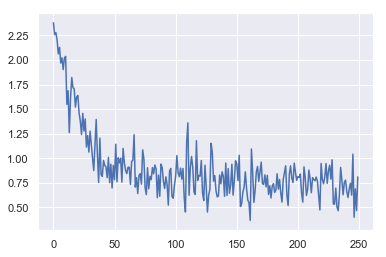

Accuracy 0.596
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


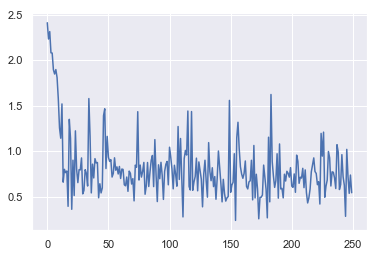

Accuracy 0.601
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


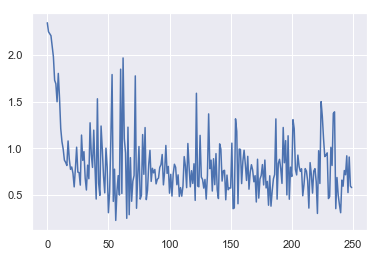

Accuracy 0.5835
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


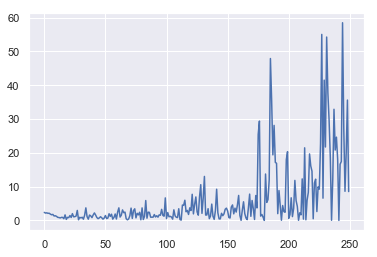

Accuracy 0.5075
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


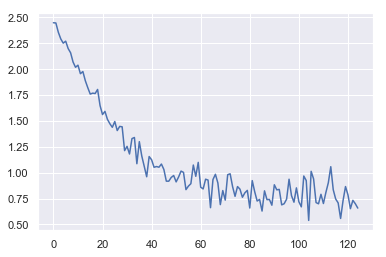

Accuracy 0.565
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


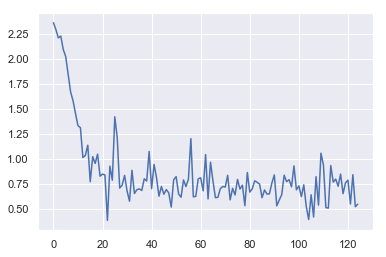

Accuracy 0.5475
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


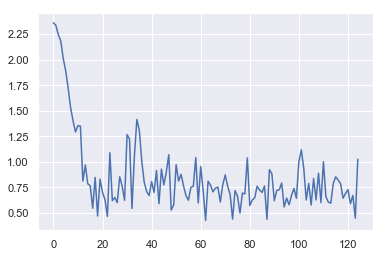

Accuracy 0.5165
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


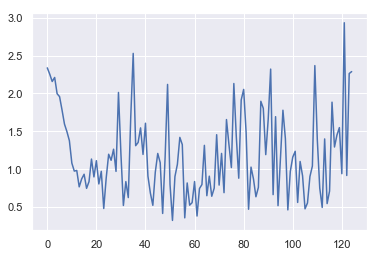

Accuracy 0.554
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


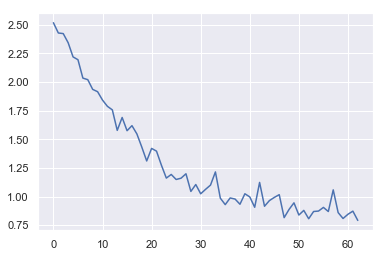

Accuracy 0.5545
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


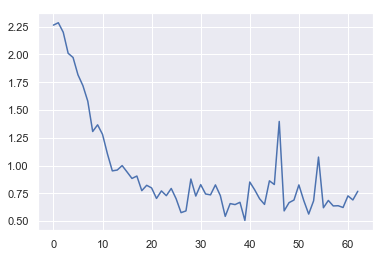

Accuracy 0.5985
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


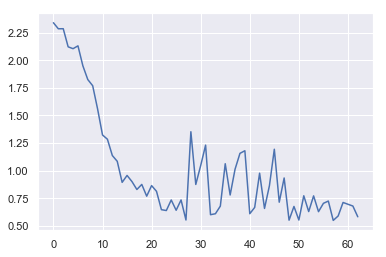

Accuracy 0.569
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


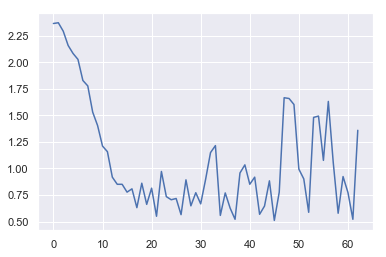

Accuracy 0.5535
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


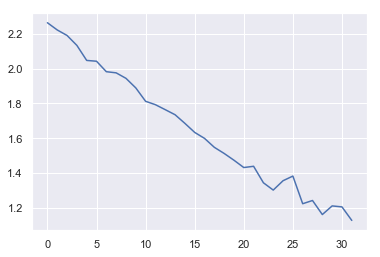

Accuracy 0.5475
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


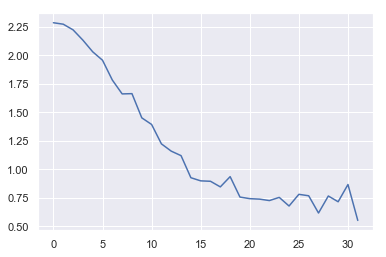

Accuracy 0.5935
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


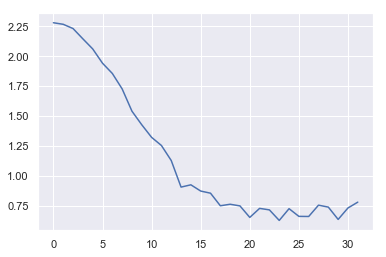

Accuracy 0.5865
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


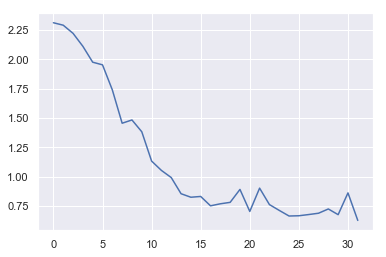

Accuracy 0.582
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


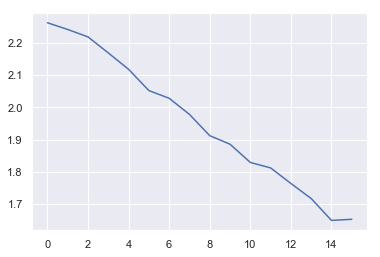

Accuracy 0.5165
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


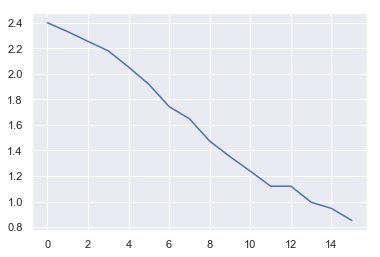

Accuracy 0.5455
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


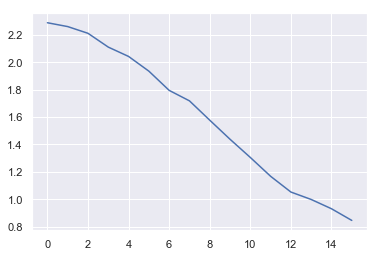

Accuracy 0.5835
Experiment {'epochs': 1, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


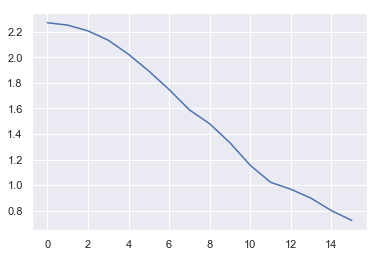

Accuracy 0.5855
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


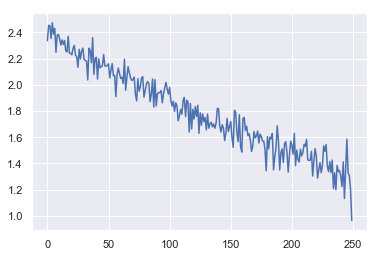

Accuracy 0.5055
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


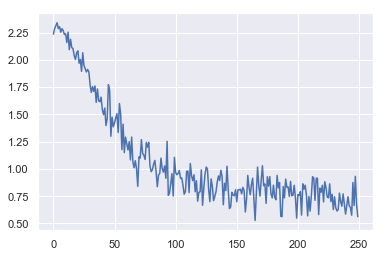

Accuracy 0.5585
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


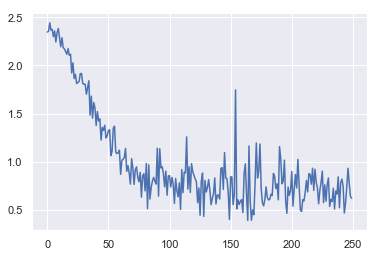

Accuracy 0.5595
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


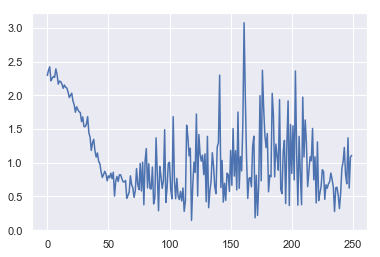

Accuracy 0.5105
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


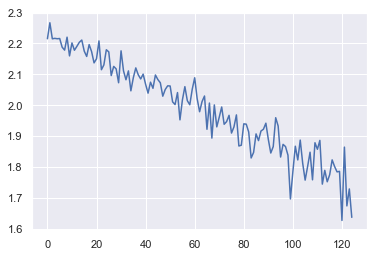

Accuracy 0.525
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


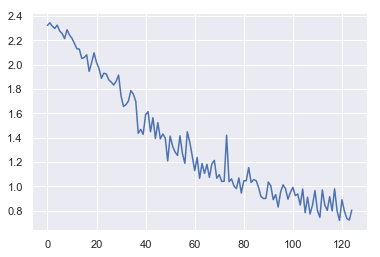

Accuracy 0.5745
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


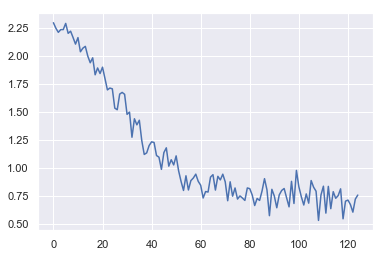

Accuracy 0.577
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


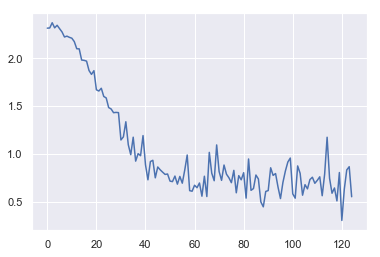

Accuracy 0.5805
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


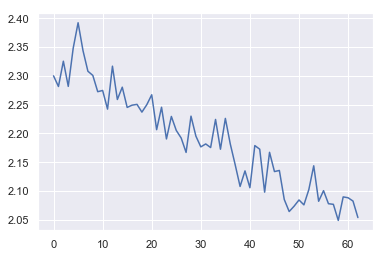

Accuracy 0.5065
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


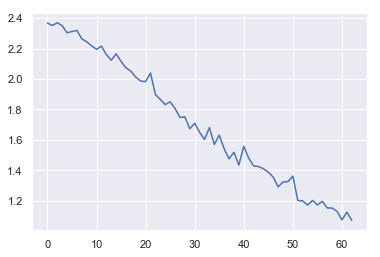

Accuracy 0.5555
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


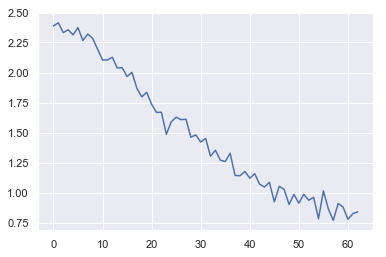

Accuracy 0.5605
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


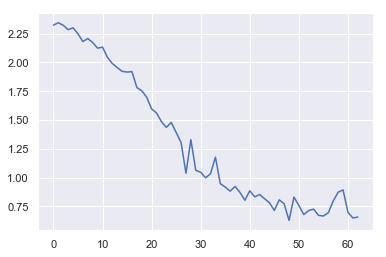

Accuracy 0.5665
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


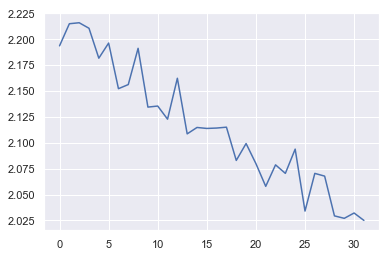

Accuracy 0.468
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


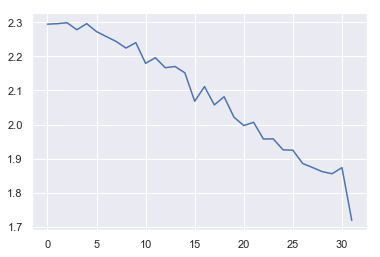

Accuracy 0.521
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


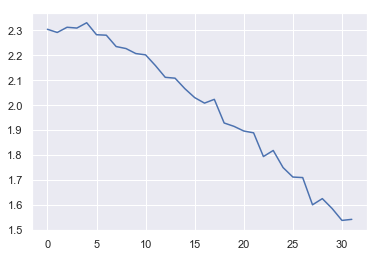

Accuracy 0.5375
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


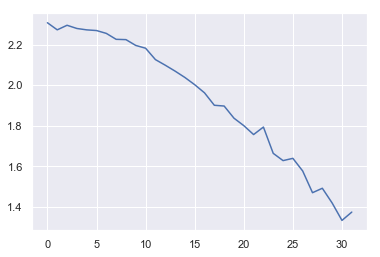

Accuracy 0.5445
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


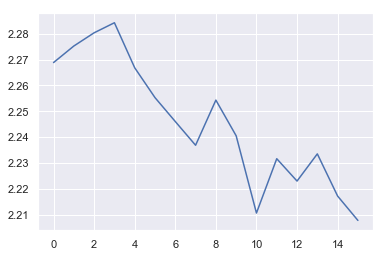

Accuracy 0.363
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


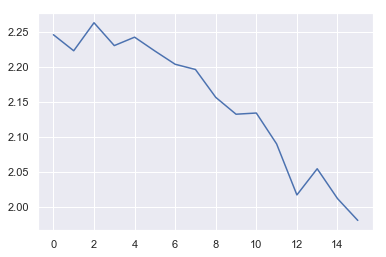

Accuracy 0.545
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


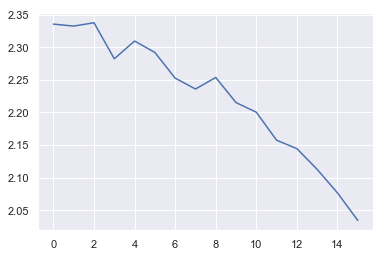

Accuracy 0.4705
Experiment {'epochs': 1, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


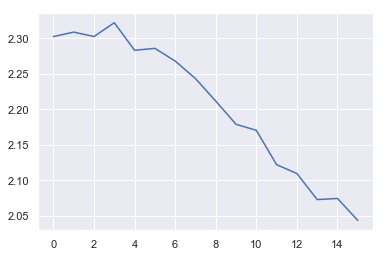

Accuracy 0.5085
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


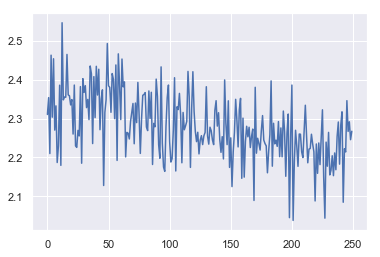

Accuracy 0.4075
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


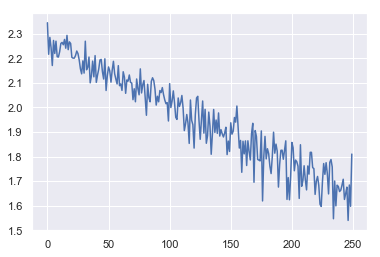

Accuracy 0.536
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


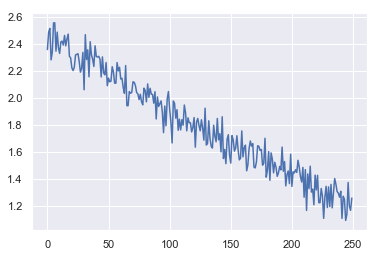

Accuracy 0.504
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


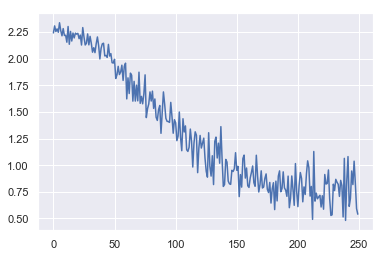

Accuracy 0.5675
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


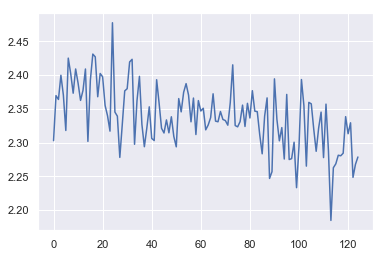

Accuracy 0.1665
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


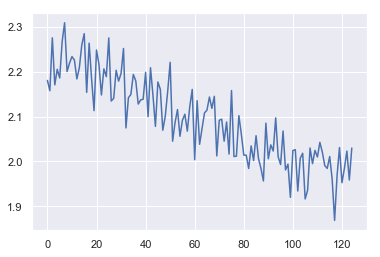

Accuracy 0.517
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


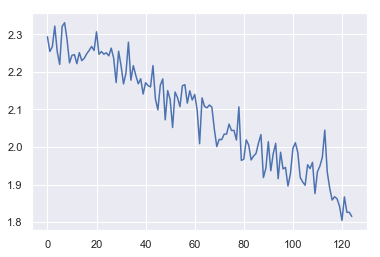

Accuracy 0.5445
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


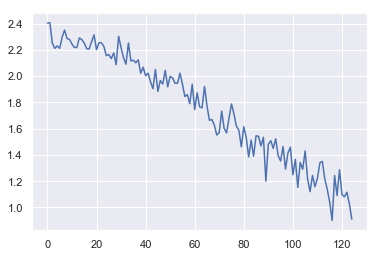

Accuracy 0.564
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


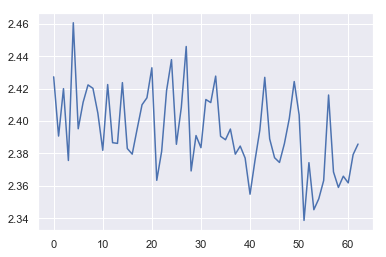

Accuracy 0.002
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


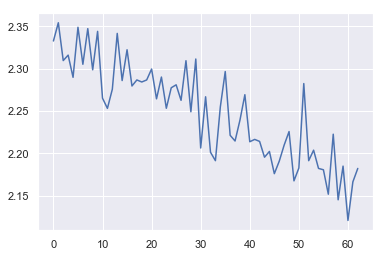

Accuracy 0.423
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


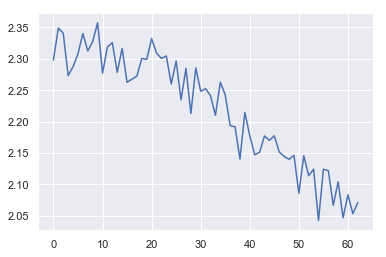

Accuracy 0.509
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


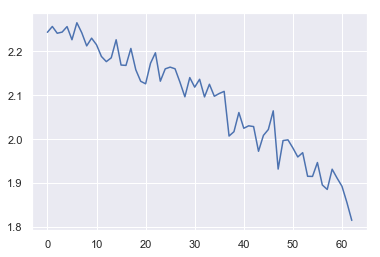

Accuracy 0.533
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


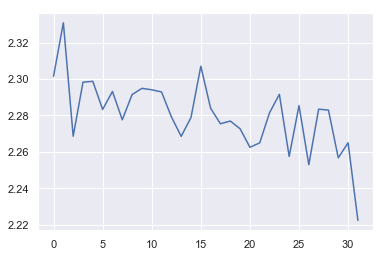

Accuracy 0.1085
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


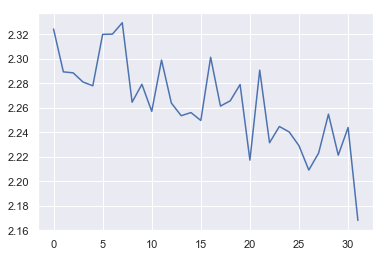

Accuracy 0.2855
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


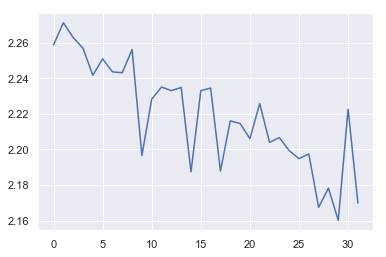

Accuracy 0.405
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


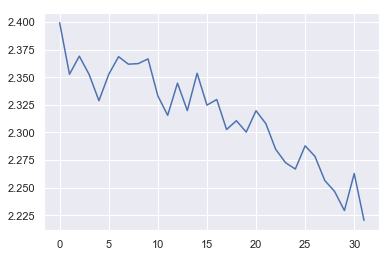

Accuracy 0.1695
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


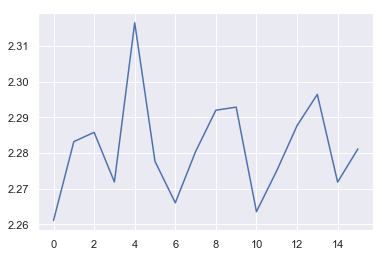

Accuracy 0.1765
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


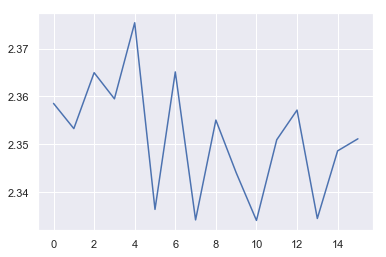

Accuracy 0.04
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


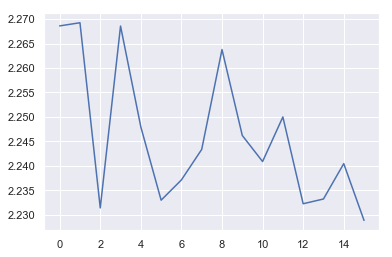

Accuracy 0.358
Experiment {'epochs': 1, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


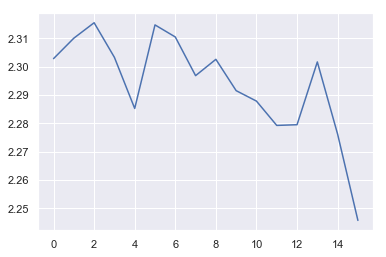

Accuracy 0.1555
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


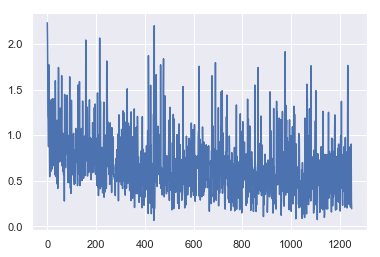

Accuracy 0.572
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


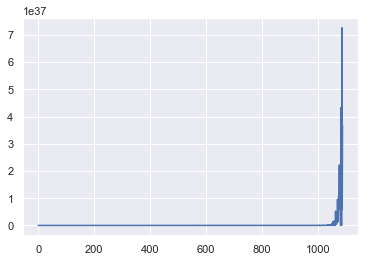

Accuracy 0.0
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


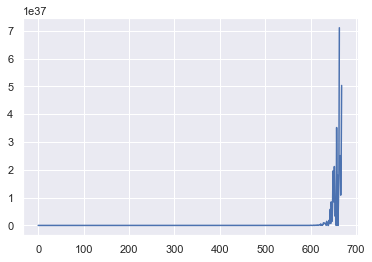

Accuracy 0.0
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


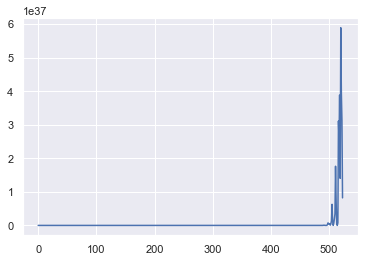

Accuracy 0.0
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


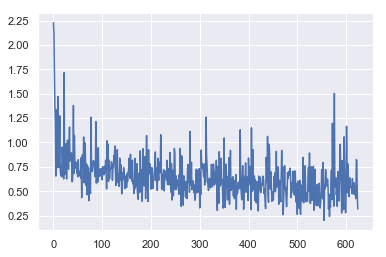

Accuracy 0.597
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


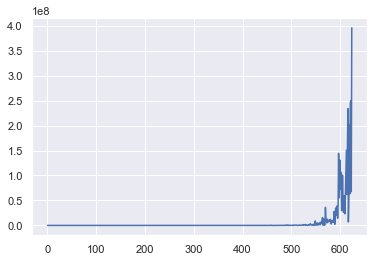

Accuracy 0.453
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


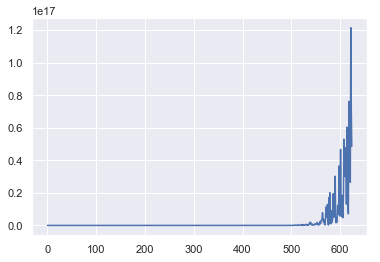

Accuracy 0.5405
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


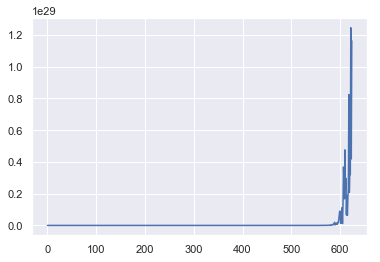

Accuracy 0.4525
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


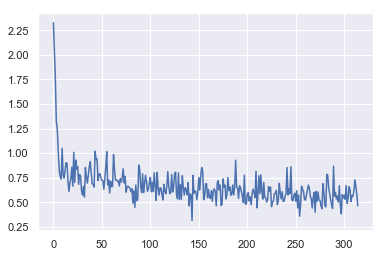

Accuracy 0.591
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


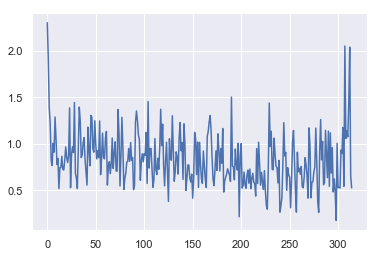

Accuracy 0.5365
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


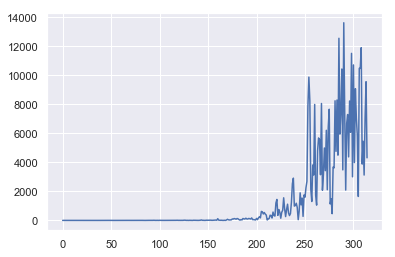

Accuracy 0.5175
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


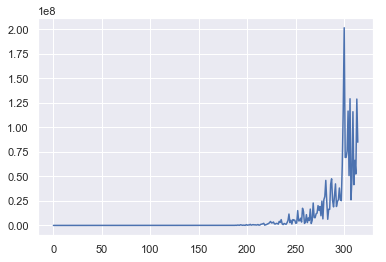

Accuracy 0.5245
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


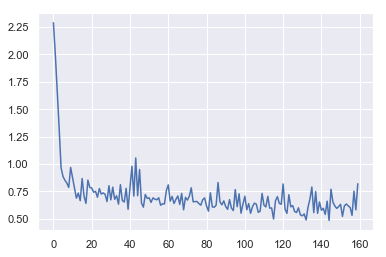

Accuracy 0.575
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


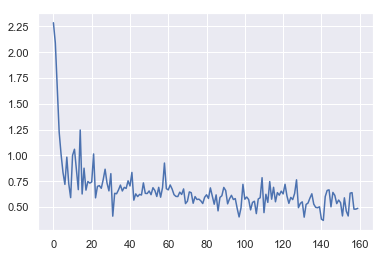

Accuracy 0.583
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


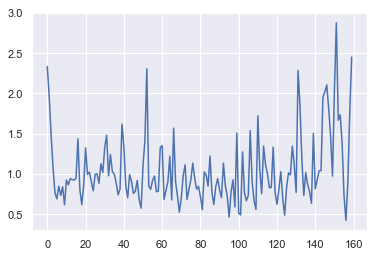

Accuracy 0.537
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


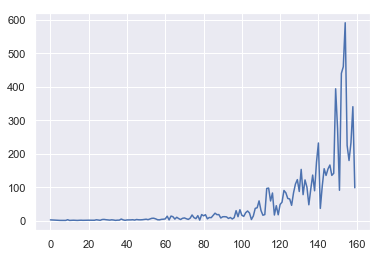

Accuracy 0.5245
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


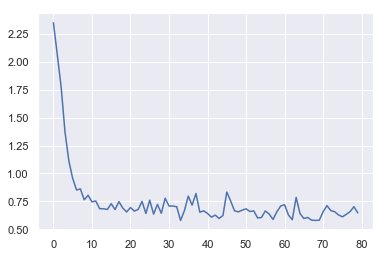

Accuracy 0.576
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


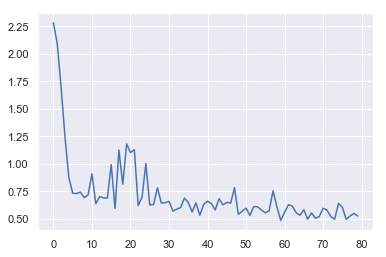

Accuracy 0.587
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


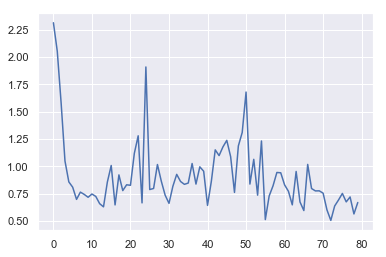

Accuracy 0.5565
Experiment {'epochs': 5, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


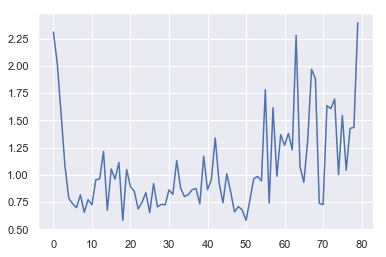

Accuracy 0.524
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


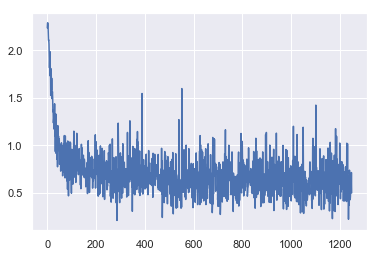

Accuracy 0.589
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


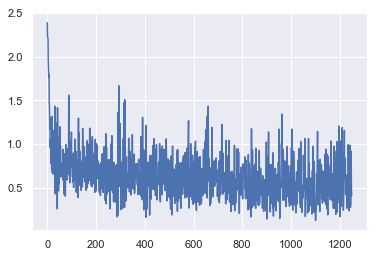

Accuracy 0.596
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


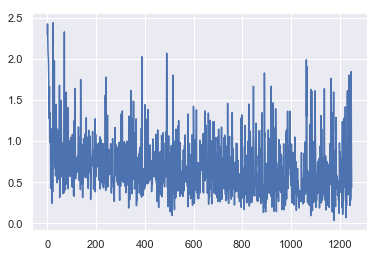

Accuracy 0.5405
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


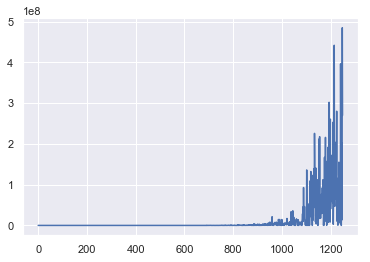

Accuracy 0.532
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


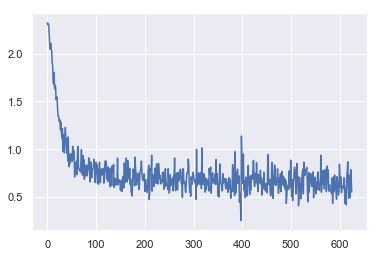

Accuracy 0.598
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


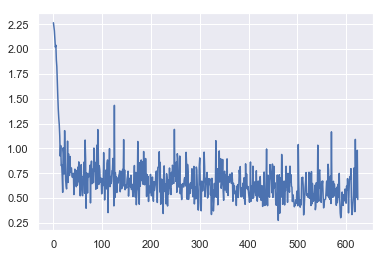

Accuracy 0.5835
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


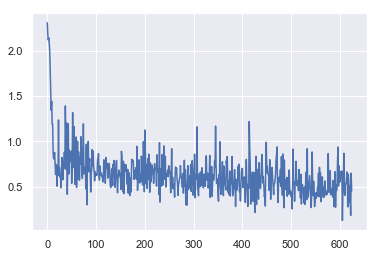

Accuracy 0.61
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


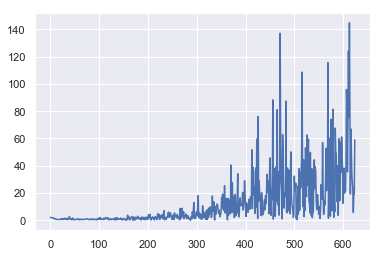

Accuracy 0.566
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


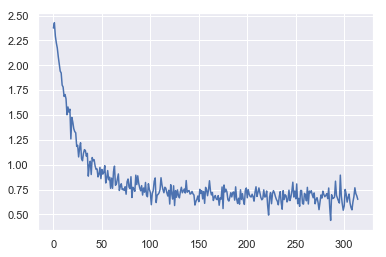

Accuracy 0.5965
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


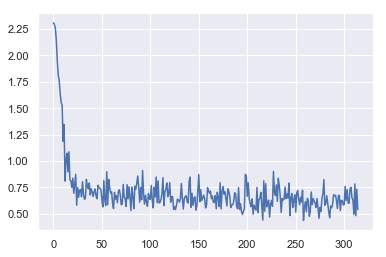

Accuracy 0.5525
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


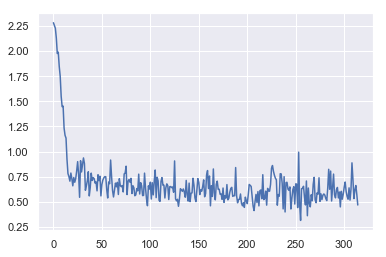

Accuracy 0.588
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


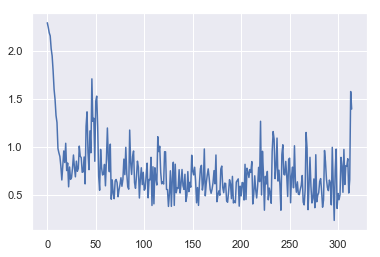

Accuracy 0.5655
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


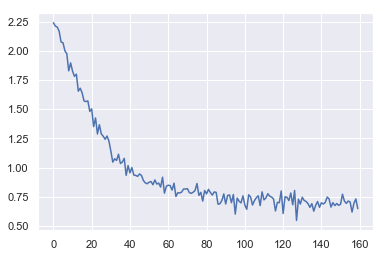

Accuracy 0.5935
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


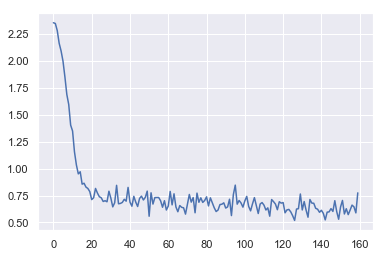

Accuracy 0.583
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


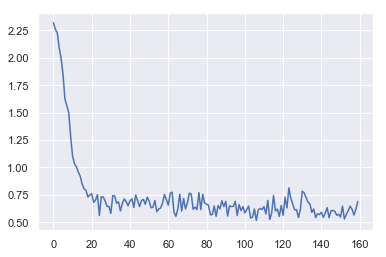

Accuracy 0.5745
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


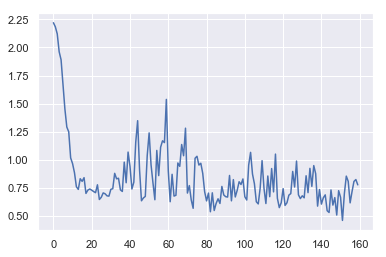

Accuracy 0.5575
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


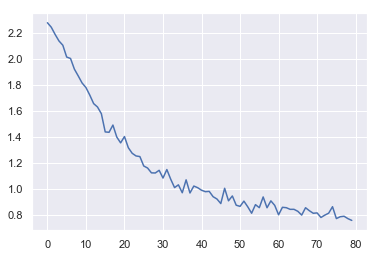

Accuracy 0.567
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


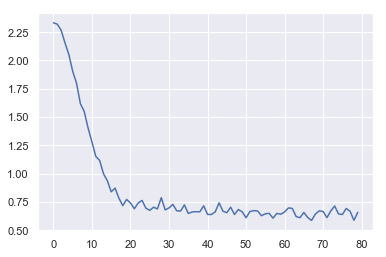

Accuracy 0.563
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


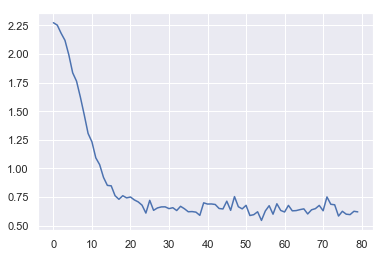

Accuracy 0.5645
Experiment {'epochs': 5, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


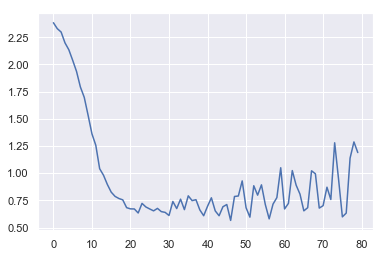

Accuracy 0.573
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


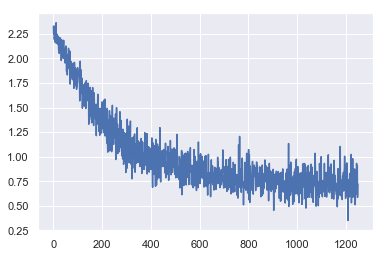

Accuracy 0.5815
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


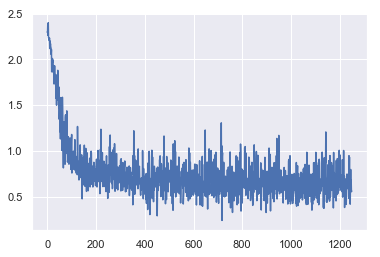

Accuracy 0.5945
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


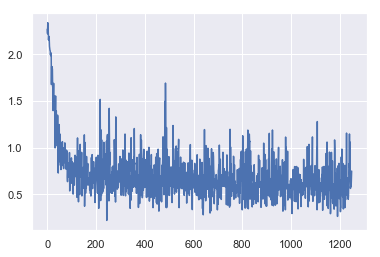

Accuracy 0.581
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


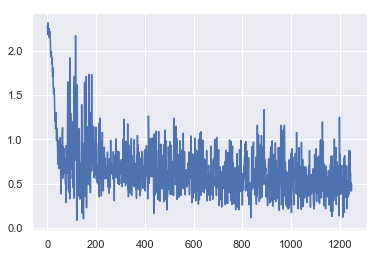

Accuracy 0.565
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


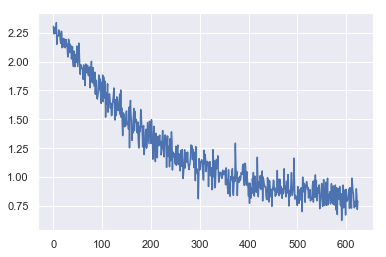

Accuracy 0.574
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


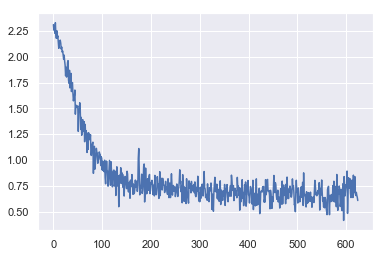

Accuracy 0.6035
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


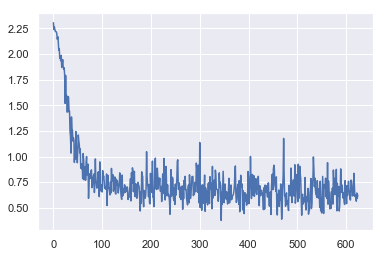

Accuracy 0.59
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


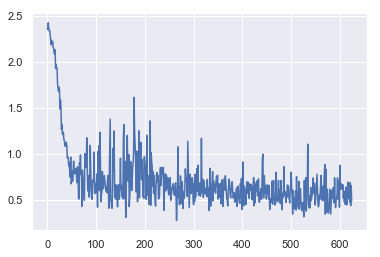

Accuracy 0.581
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


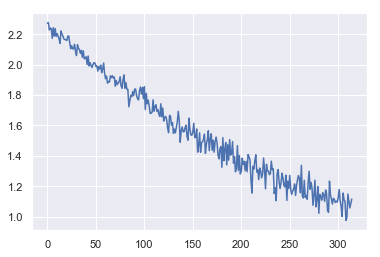

Accuracy 0.5585
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


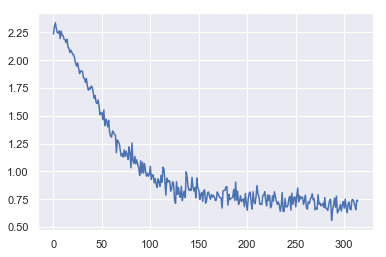

Accuracy 0.5775
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


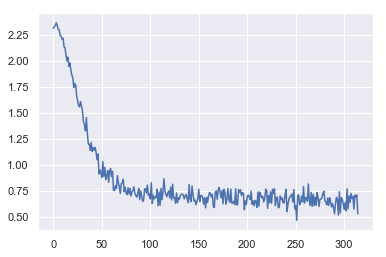

Accuracy 0.583
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


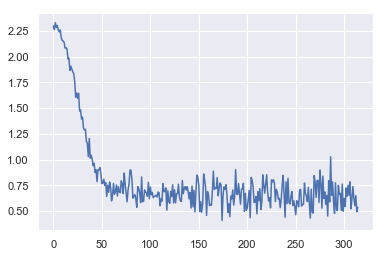

Accuracy 0.567
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


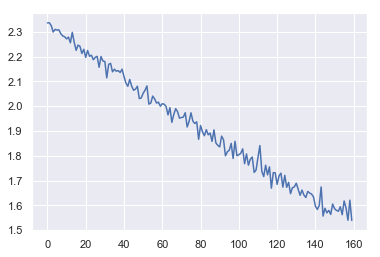

Accuracy 0.5305
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


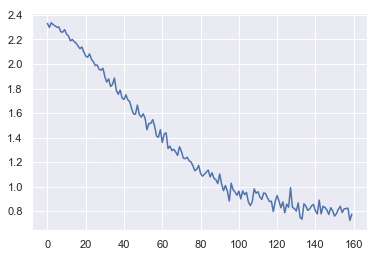

Accuracy 0.5705
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


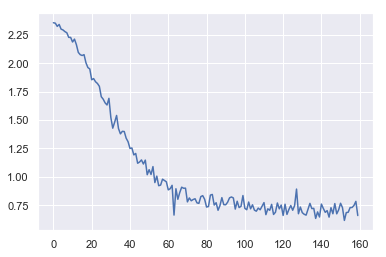

Accuracy 0.562
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


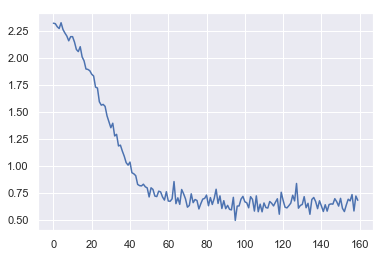

Accuracy 0.5995
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


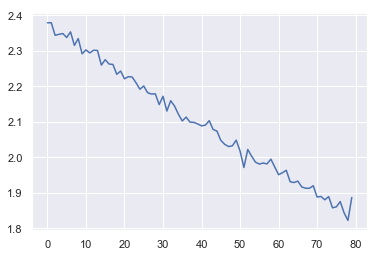

Accuracy 0.5195
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


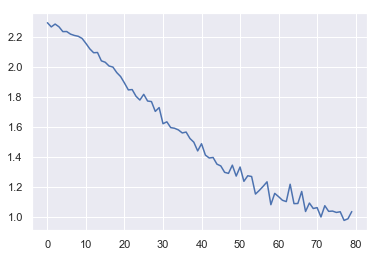

Accuracy 0.5505
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


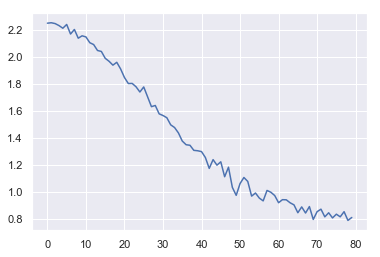

Accuracy 0.5605
Experiment {'epochs': 5, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


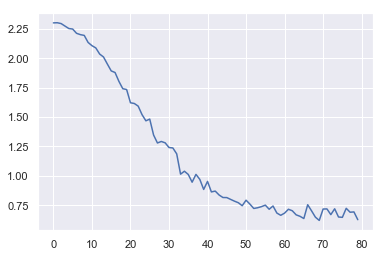

Accuracy 0.5675
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


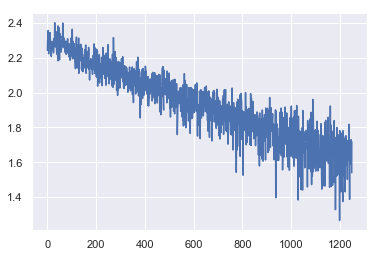

Accuracy 0.5315
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


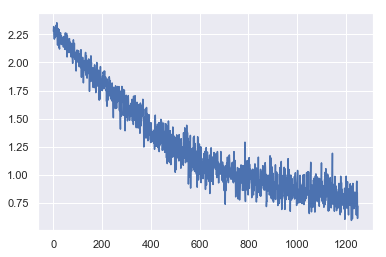

Accuracy 0.576
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


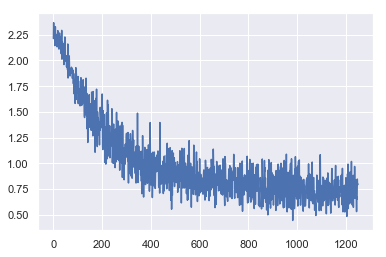

Accuracy 0.5755
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


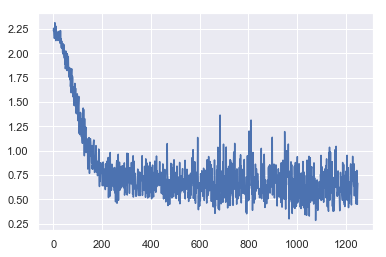

Accuracy 0.582
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


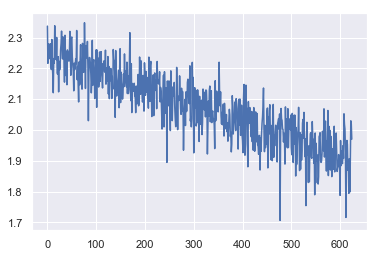

Accuracy 0.518
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


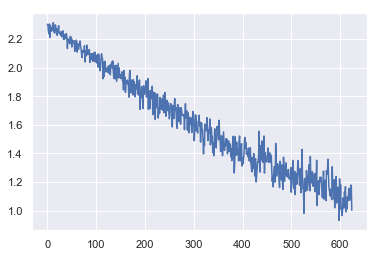

Accuracy 0.6
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


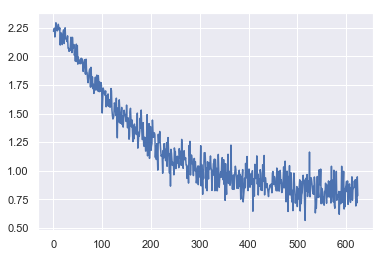

Accuracy 0.569
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


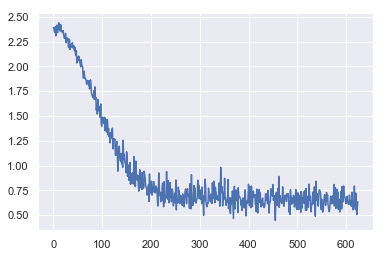

Accuracy 0.5885
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


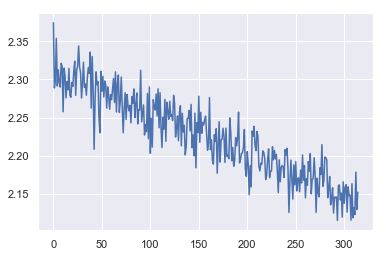

Accuracy 0.447
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


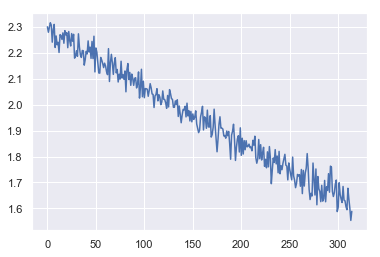

Accuracy 0.4955
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


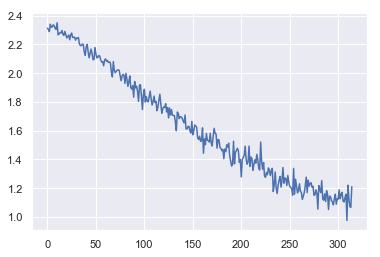

Accuracy 0.572
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


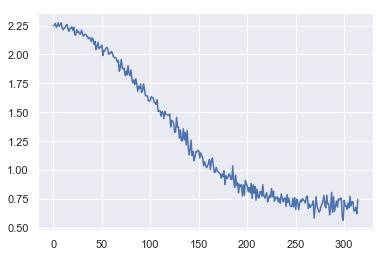

Accuracy 0.5655
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


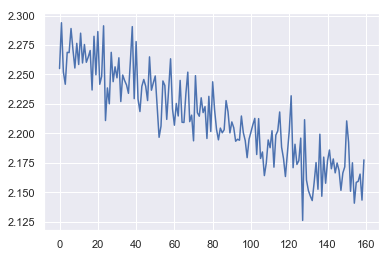

Accuracy 0.396
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


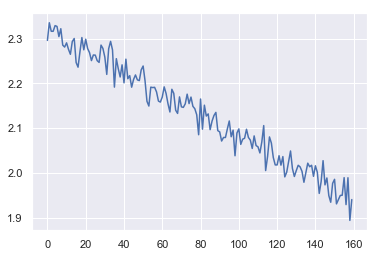

Accuracy 0.505
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


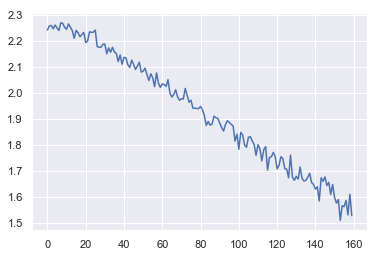

Accuracy 0.5605
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


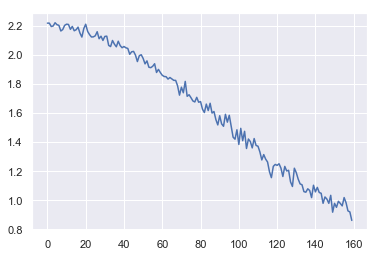

Accuracy 0.559
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


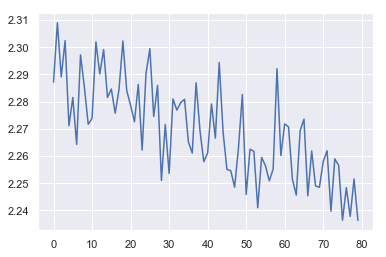

Accuracy 0.259
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


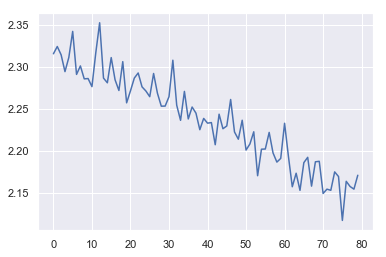

Accuracy 0.4625
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


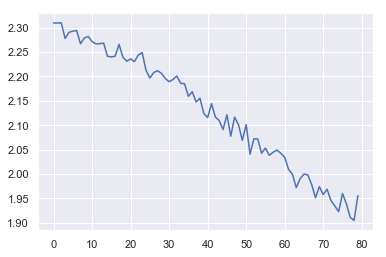

Accuracy 0.487
Experiment {'epochs': 5, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


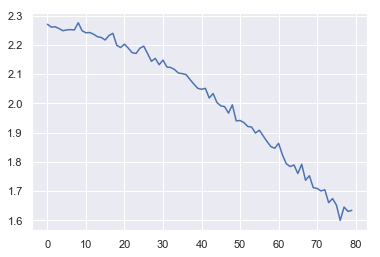

Accuracy 0.537
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


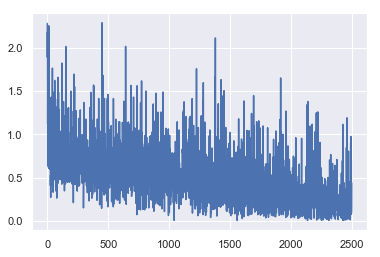

Accuracy 0.5485
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


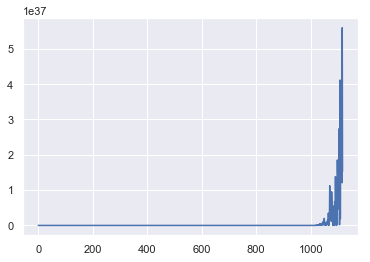

Accuracy 0.0
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


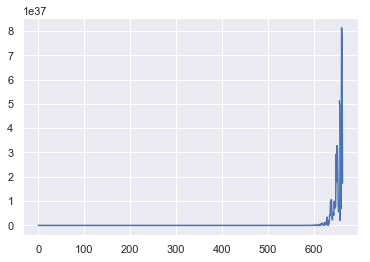

Accuracy 0.0
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


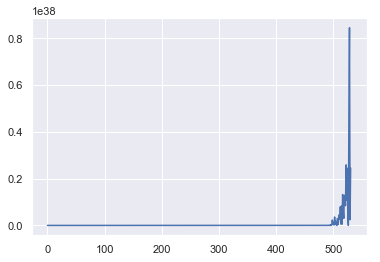

Accuracy 0.0
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


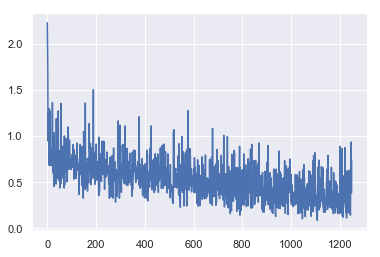

Accuracy 0.565
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


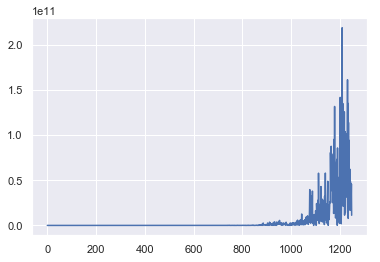

Accuracy 0.517
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


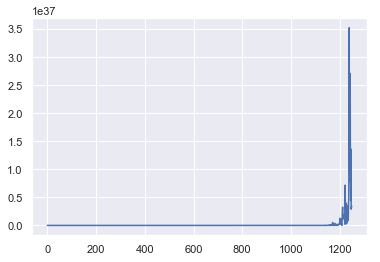

Accuracy 0.54
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


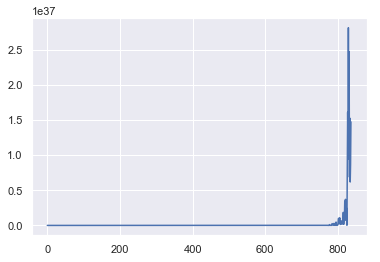

Accuracy 0.0
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


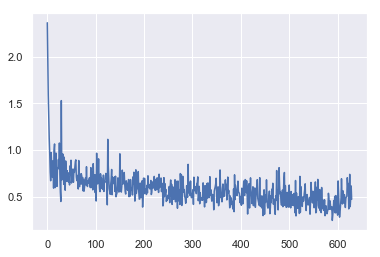

Accuracy 0.588
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


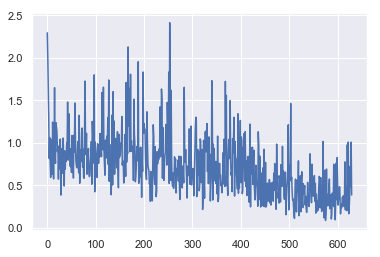

Accuracy 0.5595
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


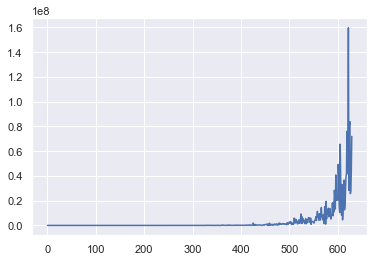

Accuracy 0.55
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


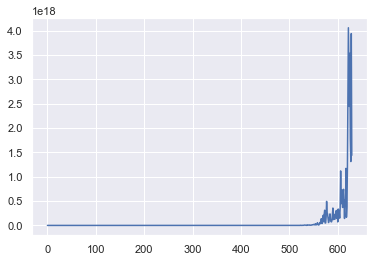

Accuracy 0.497
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


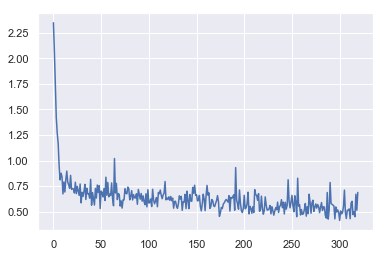

Accuracy 0.5605
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


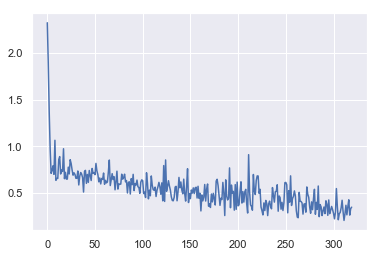

Accuracy 0.5785
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


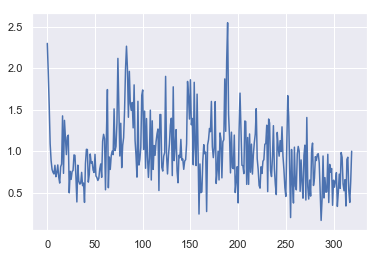

Accuracy 0.535
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


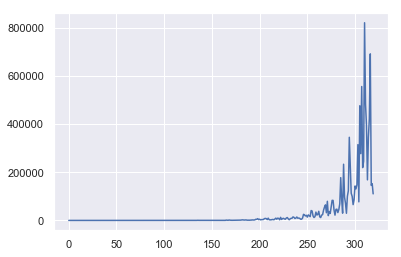

Accuracy 0.517
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


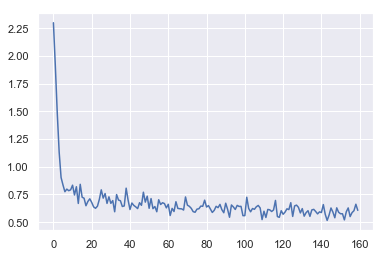

Accuracy 0.559
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


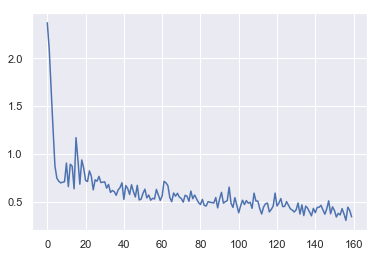

Accuracy 0.5695
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


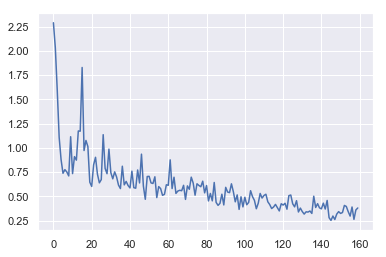

Accuracy 0.5955
Experiment {'epochs': 10, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


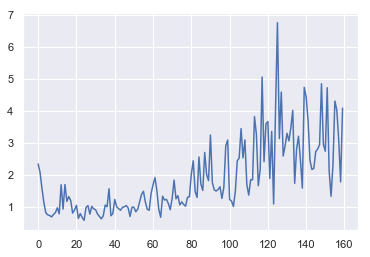

Accuracy 0.5225
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


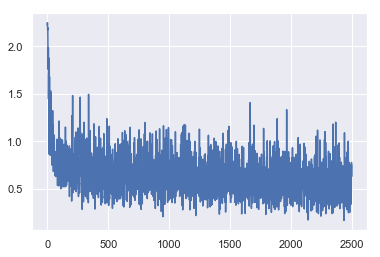

Accuracy 0.5545
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


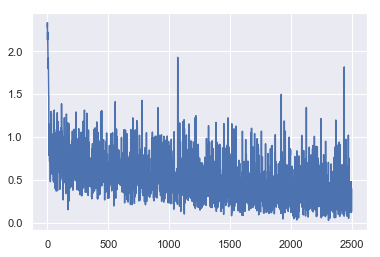

Accuracy 0.5825
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


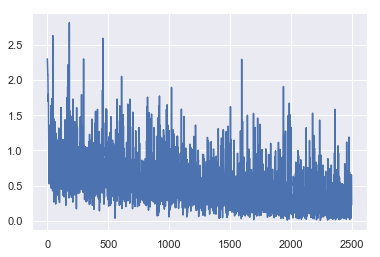

Accuracy 0.569
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


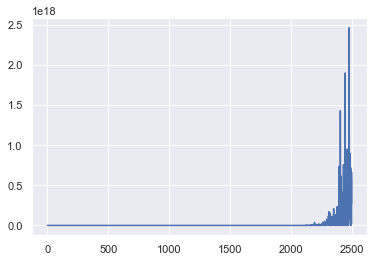

Accuracy 0.5035
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


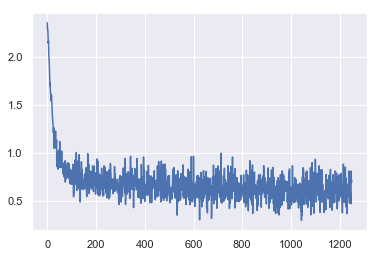

Accuracy 0.57
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


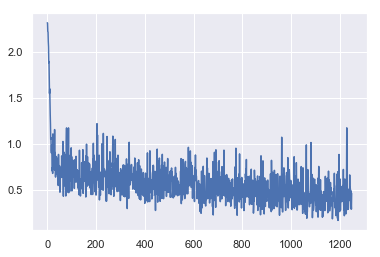

Accuracy 0.5605
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


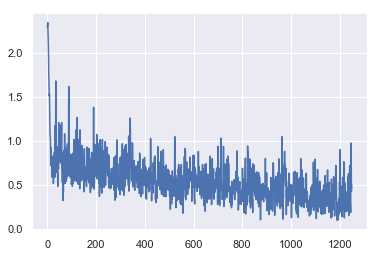

Accuracy 0.5855
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


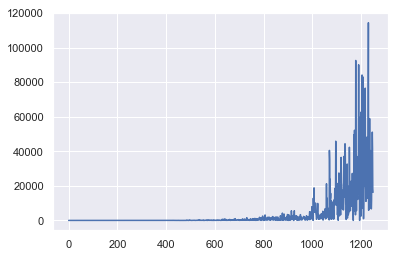

Accuracy 0.4805
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


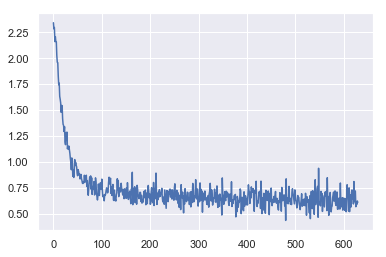

Accuracy 0.589
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


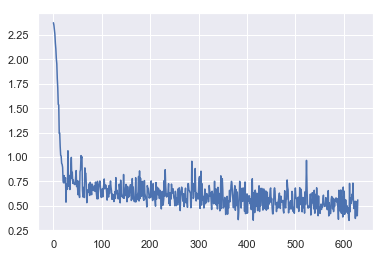

Accuracy 0.601
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


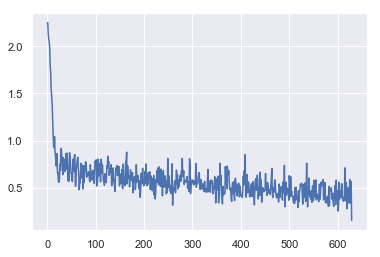

Accuracy 0.581
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


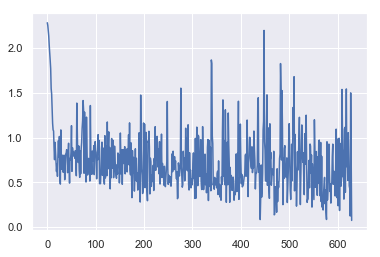

Accuracy 0.567
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


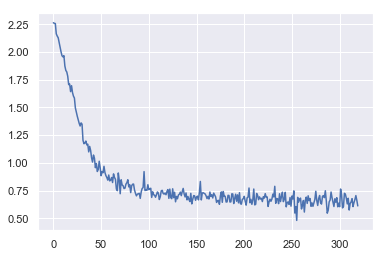

Accuracy 0.583
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


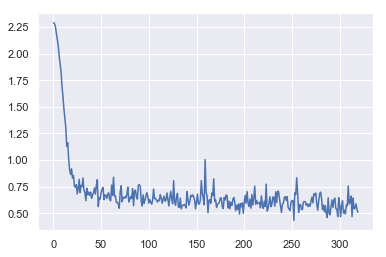

Accuracy 0.5925
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


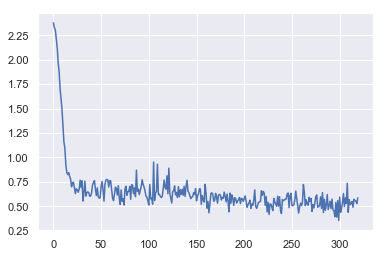

Accuracy 0.5785
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


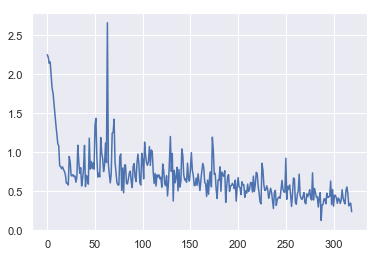

Accuracy 0.582
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


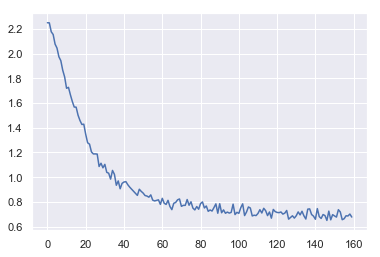

Accuracy 0.587
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


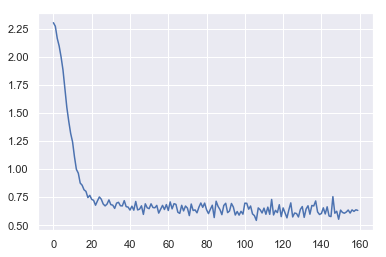

Accuracy 0.606
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


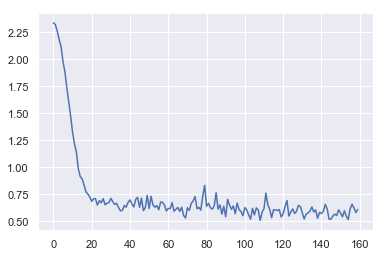

Accuracy 0.578
Experiment {'epochs': 10, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


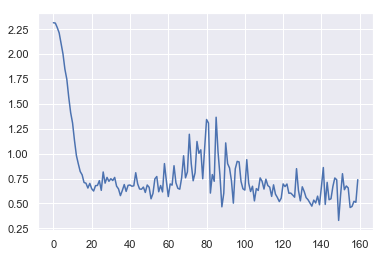

Accuracy 0.542
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


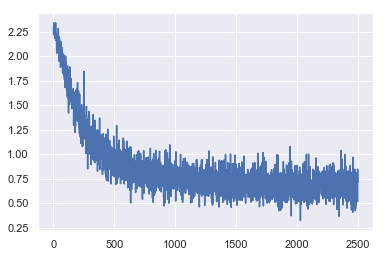

Accuracy 0.594
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


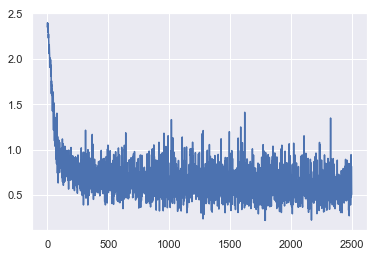

Accuracy 0.6105
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


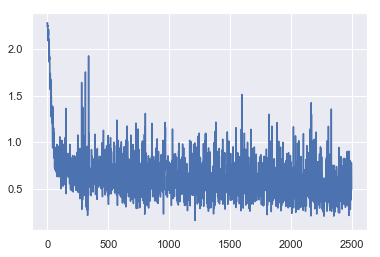

Accuracy 0.5985
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


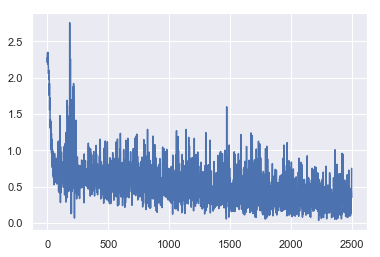

Accuracy 0.597
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


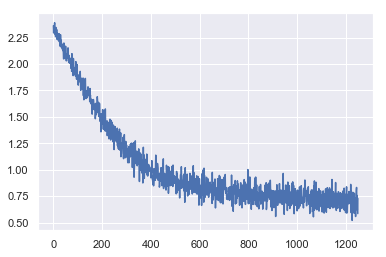

Accuracy 0.571
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


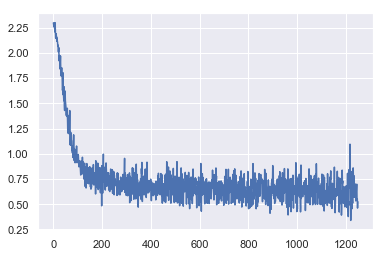

Accuracy 0.58
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


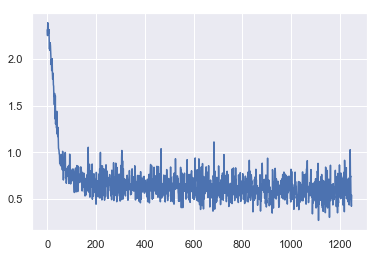

Accuracy 0.587
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


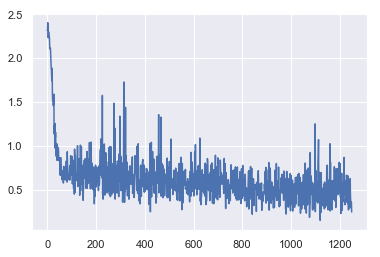

Accuracy 0.5765
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


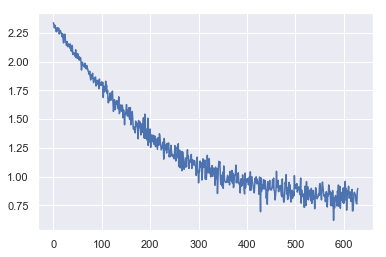

Accuracy 0.5675
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


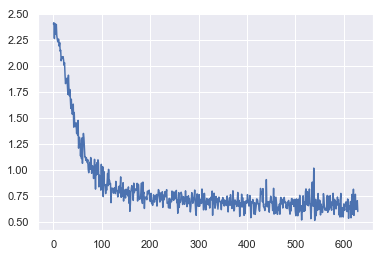

Accuracy 0.6
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


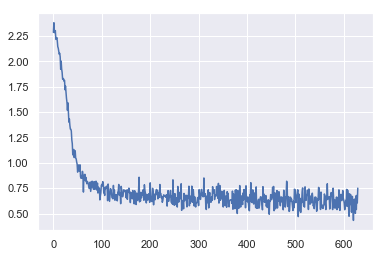

Accuracy 0.6035
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


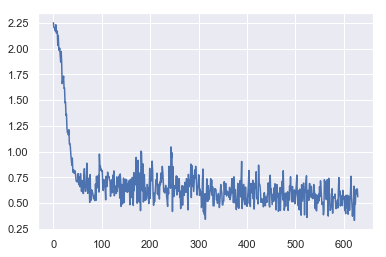

Accuracy 0.577
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


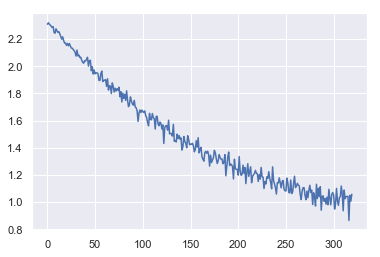

Accuracy 0.5805
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


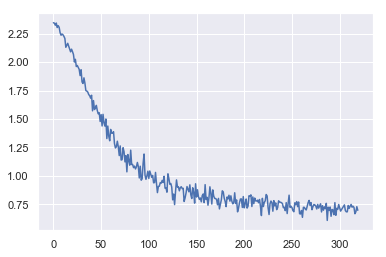

Accuracy 0.5725
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


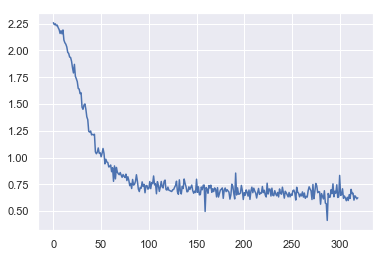

Accuracy 0.5825
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


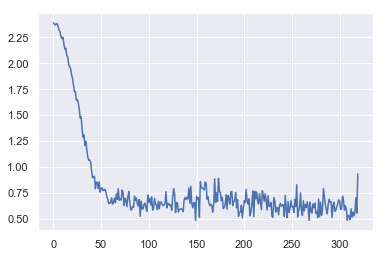

Accuracy 0.5845
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


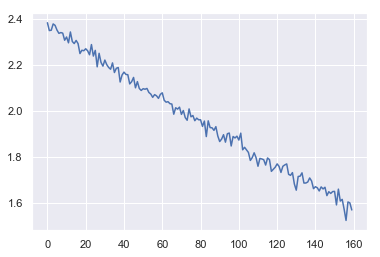

Accuracy 0.5665
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


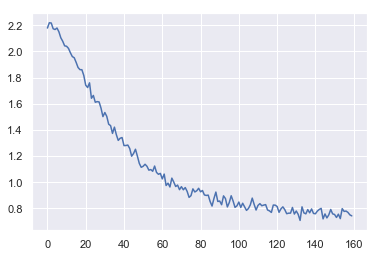

Accuracy 0.566
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


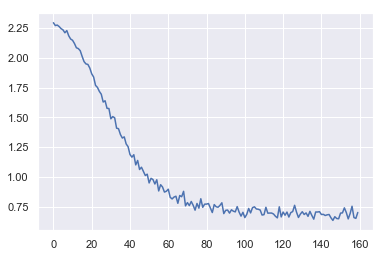

Accuracy 0.577
Experiment {'epochs': 10, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


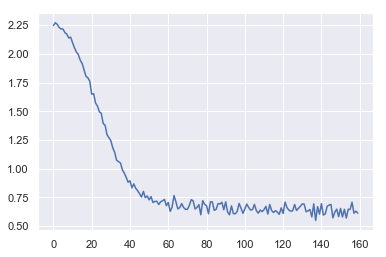

Accuracy 0.5965
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


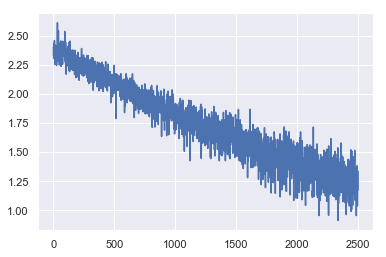

Accuracy 0.548
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


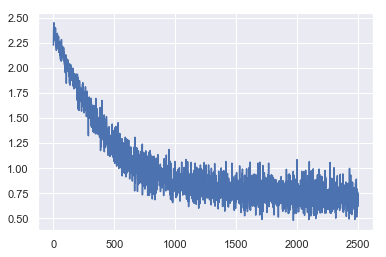

Accuracy 0.5695
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


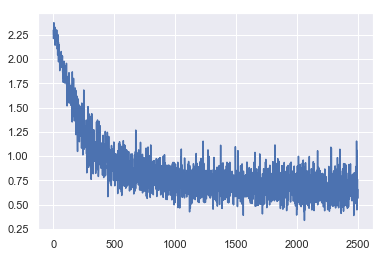

Accuracy 0.5845
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


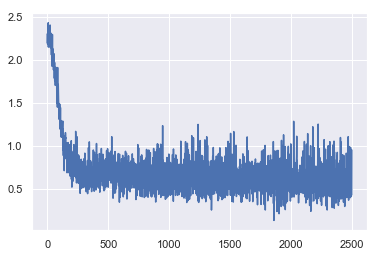

Accuracy 0.593
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


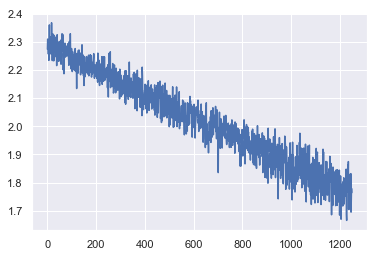

Accuracy 0.488
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


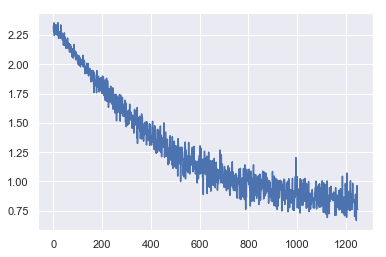

Accuracy 0.5695
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


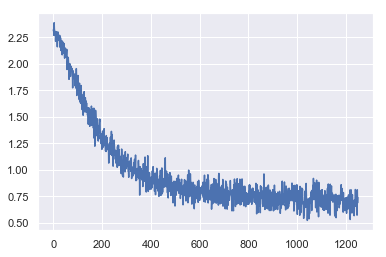

Accuracy 0.5745
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


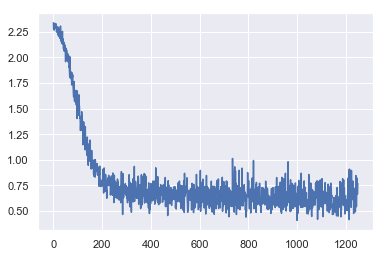

Accuracy 0.5775
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


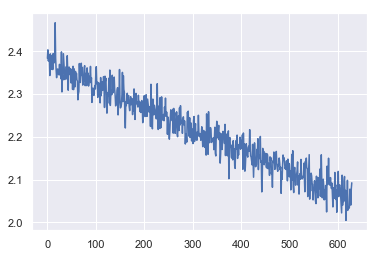

Accuracy 0.487
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


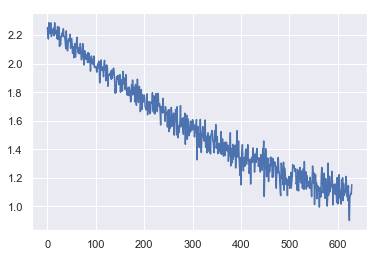

Accuracy 0.5715
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


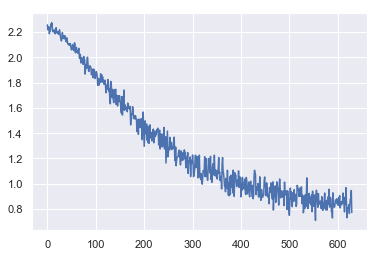

Accuracy 0.557
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


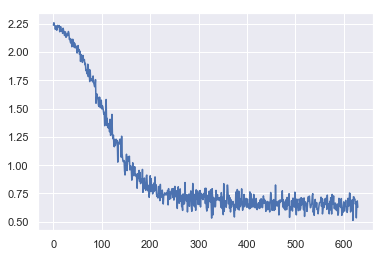

Accuracy 0.595
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


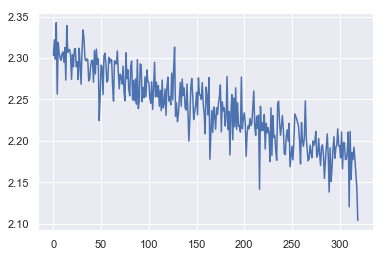

Accuracy 0.3825
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


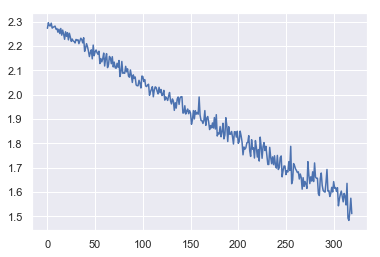

Accuracy 0.551
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


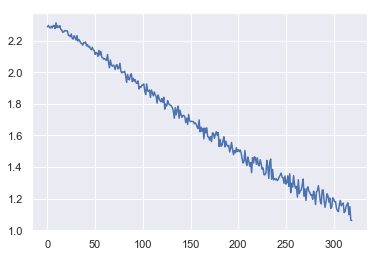

Accuracy 0.5715
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


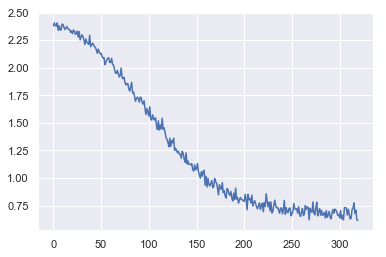

Accuracy 0.579
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


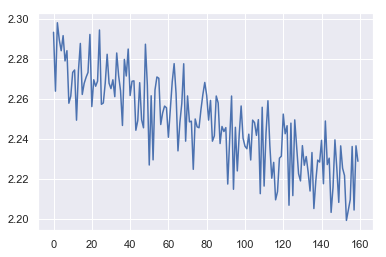

Accuracy 0.357
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


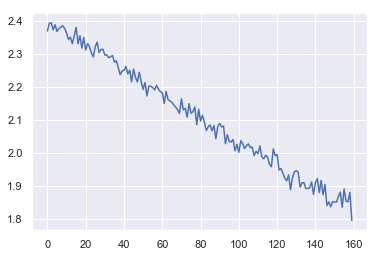

Accuracy 0.527
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


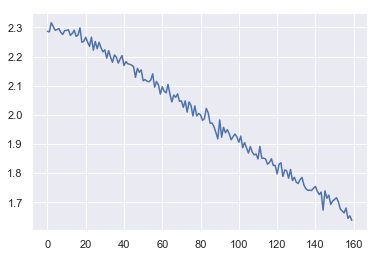

Accuracy 0.5145
Experiment {'epochs': 10, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


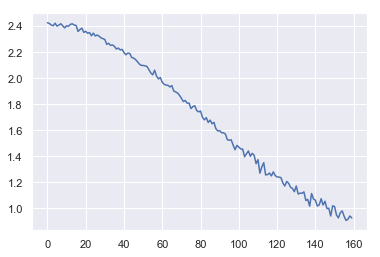

Accuracy 0.555
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


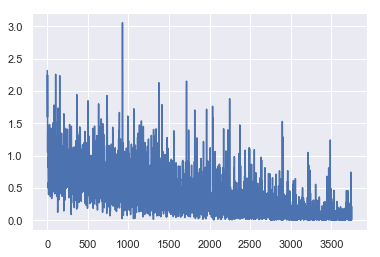

Accuracy 0.565
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


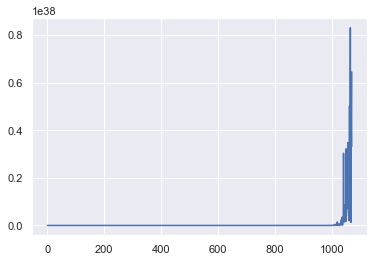

Accuracy 0.0
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


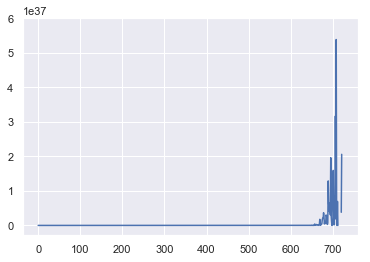

Accuracy 0.0
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


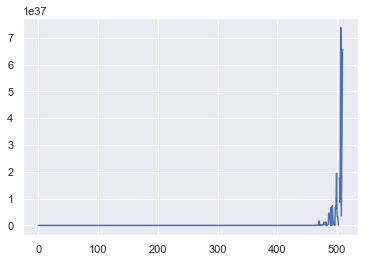

Accuracy 0.0
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


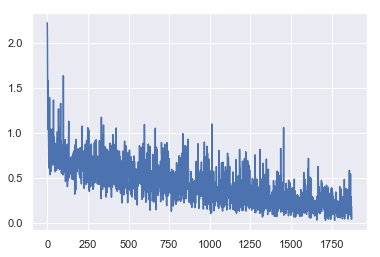

Accuracy 0.604
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


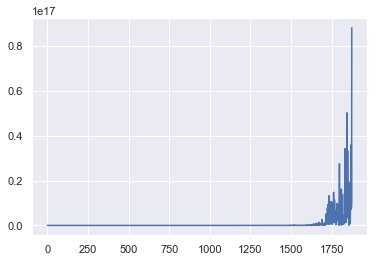

Accuracy 0.5415
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


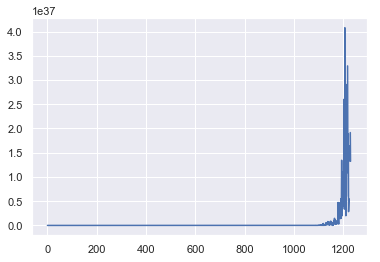

Accuracy 0.0
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


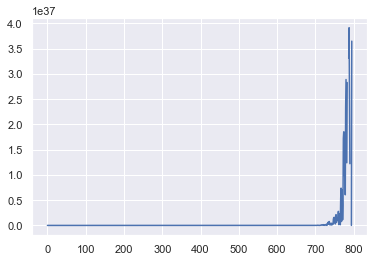

Accuracy 0.0
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


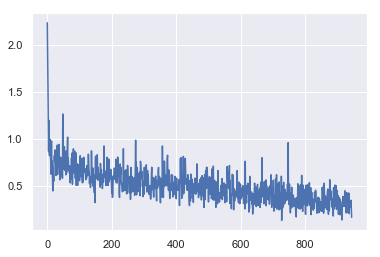

Accuracy 0.6105
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


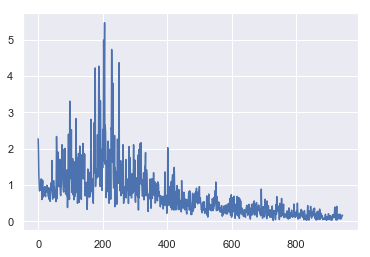

Accuracy 0.585
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


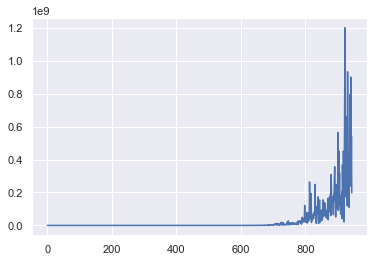

Accuracy 0.536
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


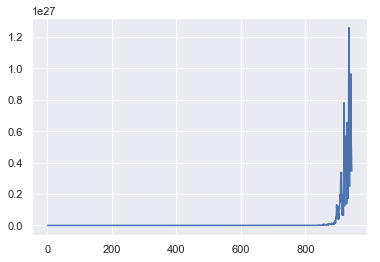

Accuracy 0.515
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


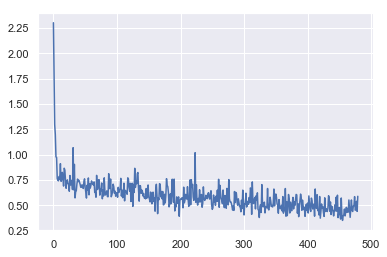

Accuracy 0.6025
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


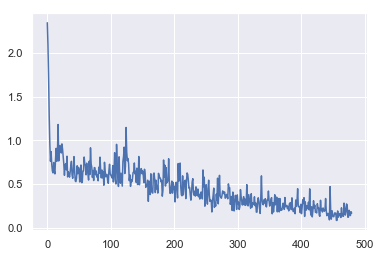

Accuracy 0.5885
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


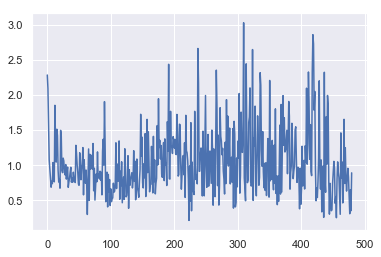

Accuracy 0.52
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


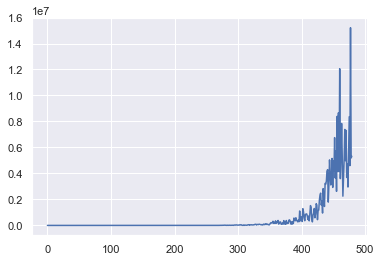

Accuracy 0.5125
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


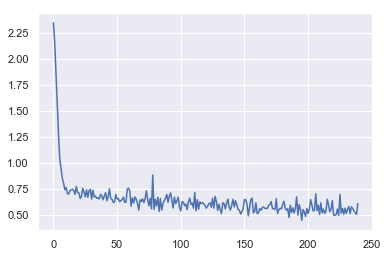

Accuracy 0.581
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


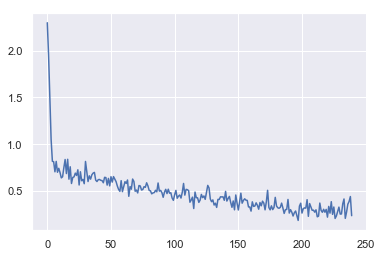

Accuracy 0.5745
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


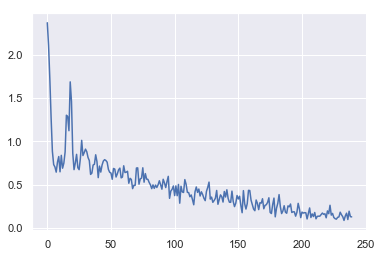

Accuracy 0.599
Experiment {'epochs': 15, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


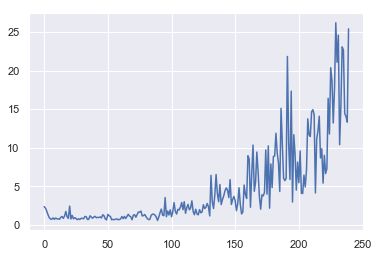

Accuracy 0.5625
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


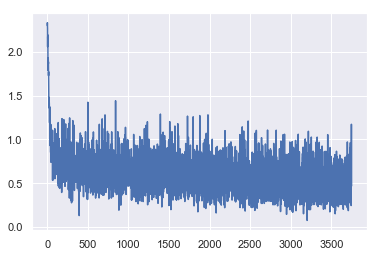

Accuracy 0.5925
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


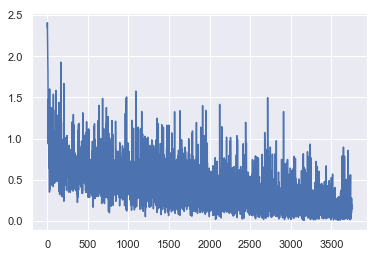

Accuracy 0.592
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


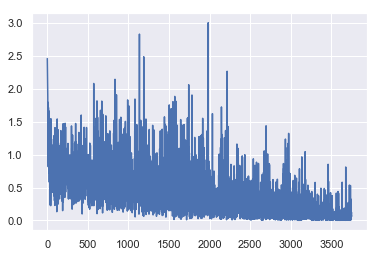

Accuracy 0.5825
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


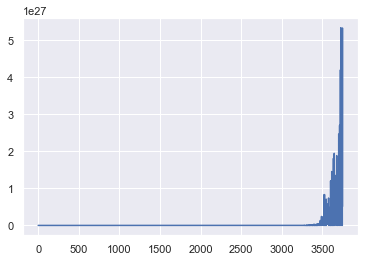

Accuracy 0.557
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


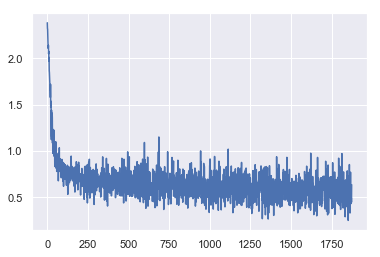

Accuracy 0.5745
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


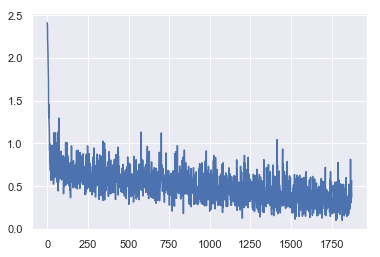

Accuracy 0.6
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


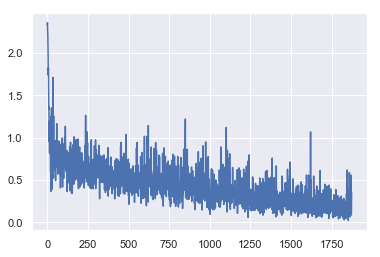

Accuracy 0.584
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


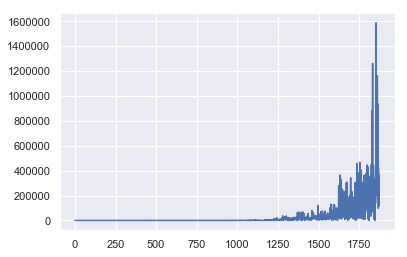

Accuracy 0.517
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


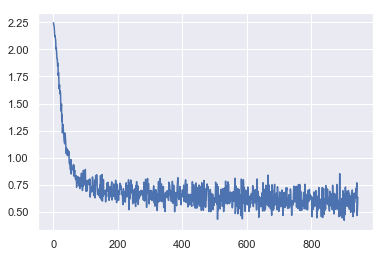

Accuracy 0.5715
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


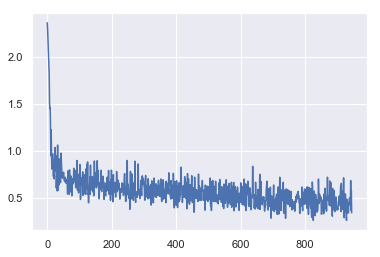

Accuracy 0.6115
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


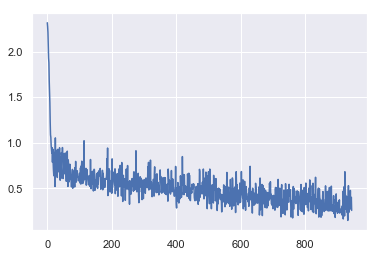

Accuracy 0.5835
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


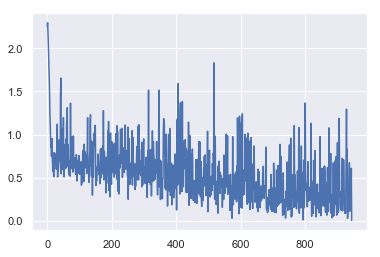

Accuracy 0.571
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


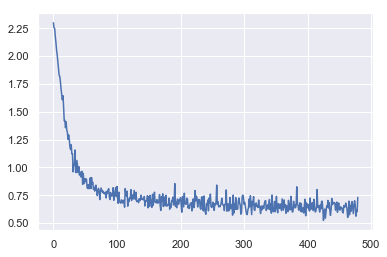

Accuracy 0.561
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


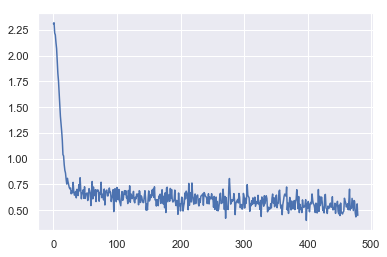

Accuracy 0.585
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


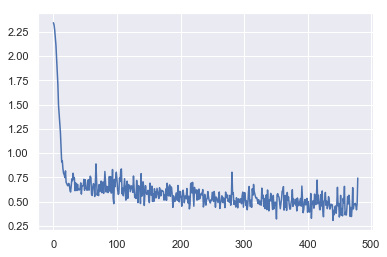

Accuracy 0.58
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


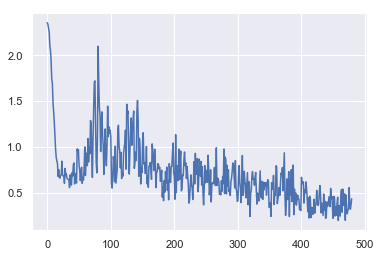

Accuracy 0.5785
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


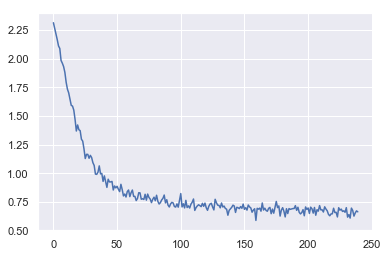

Accuracy 0.594
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


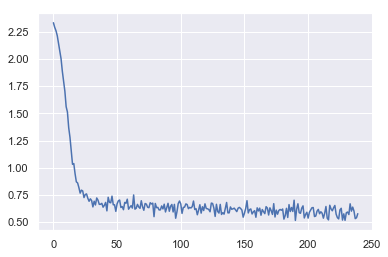

Accuracy 0.592
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


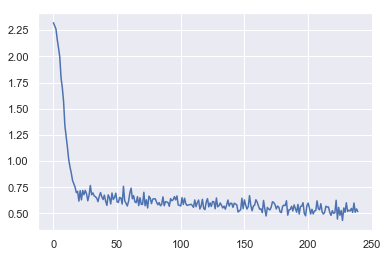

Accuracy 0.581
Experiment {'epochs': 15, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


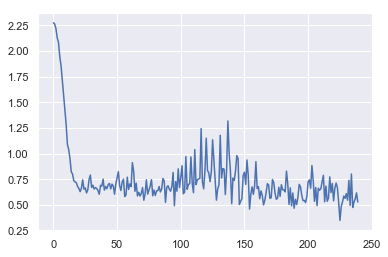

Accuracy 0.555
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


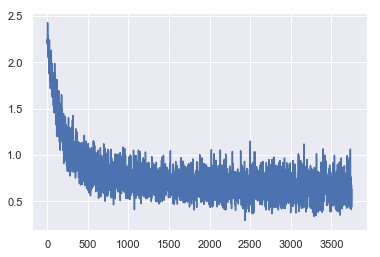

Accuracy 0.5775
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


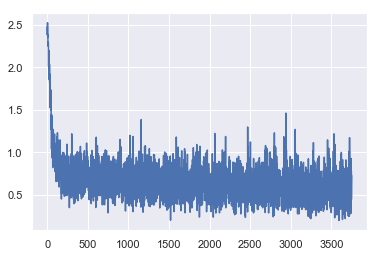

Accuracy 0.569
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


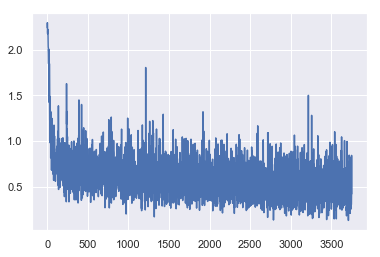

Accuracy 0.5995
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


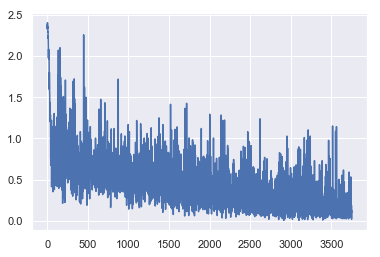

Accuracy 0.591
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


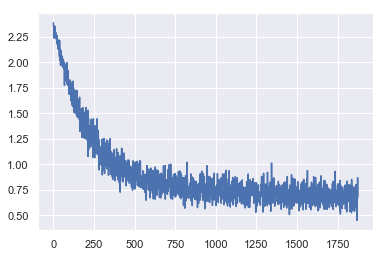

Accuracy 0.5835
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


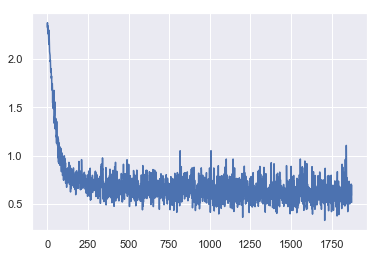

Accuracy 0.5925
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


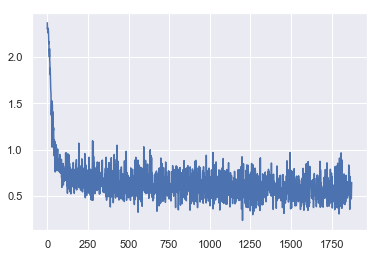

Accuracy 0.5875
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


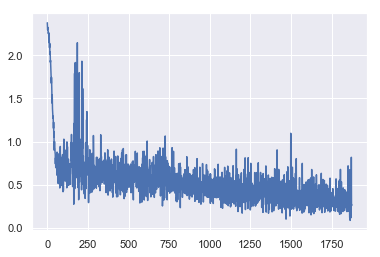

Accuracy 0.5955
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


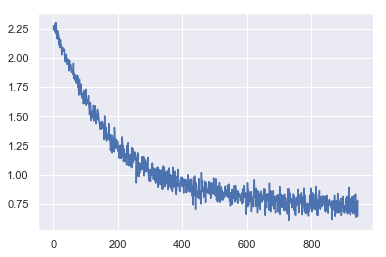

Accuracy 0.568
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


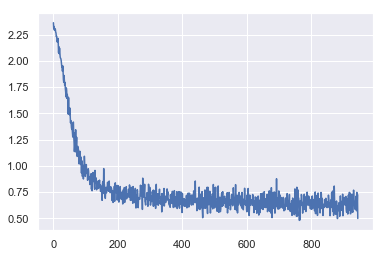

Accuracy 0.5865
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


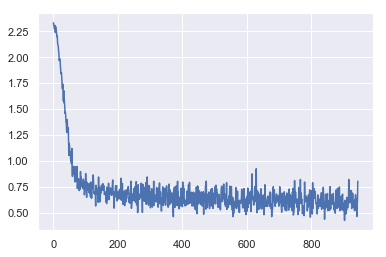

Accuracy 0.5845
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


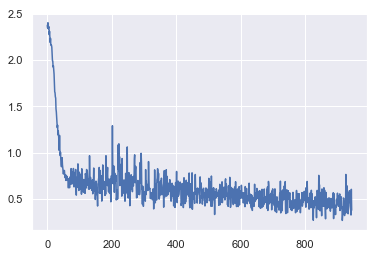

Accuracy 0.588
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


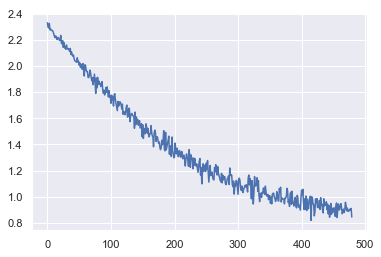

Accuracy 0.574
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


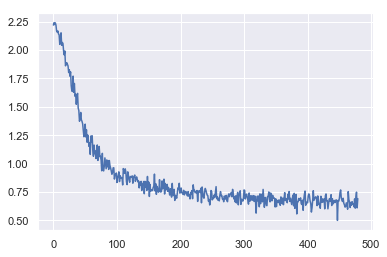

Accuracy 0.5985
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


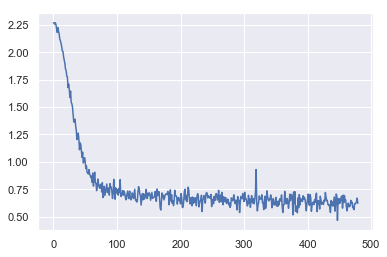

Accuracy 0.577
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


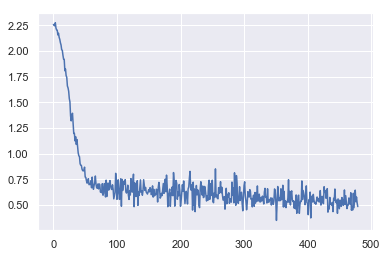

Accuracy 0.573
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


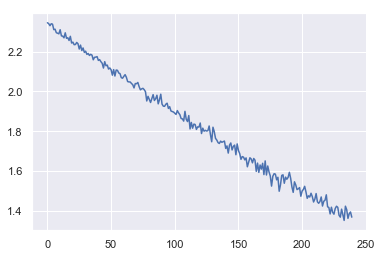

Accuracy 0.536
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


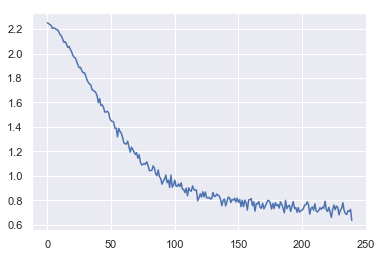

Accuracy 0.579
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


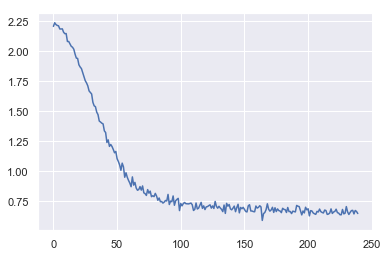

Accuracy 0.5865
Experiment {'epochs': 15, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


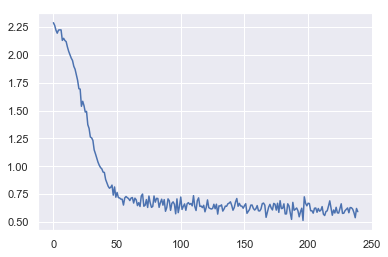

Accuracy 0.5765
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


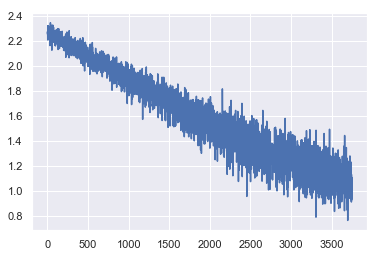

Accuracy 0.555
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


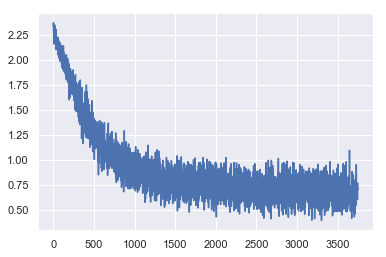

Accuracy 0.583
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


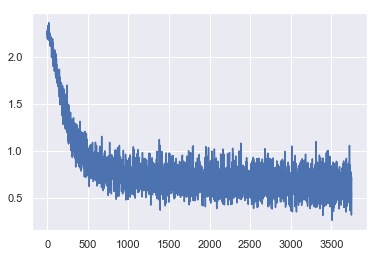

Accuracy 0.6095
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


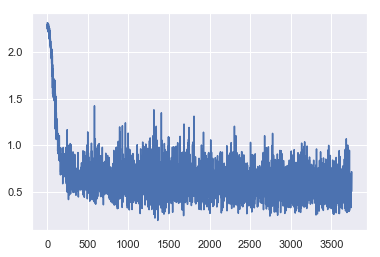

Accuracy 0.5875
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


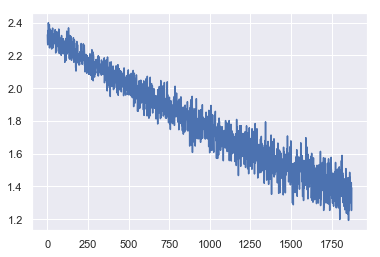

Accuracy 0.5405
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


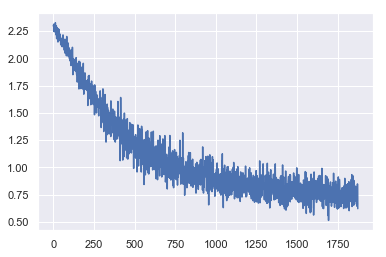

Accuracy 0.58
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


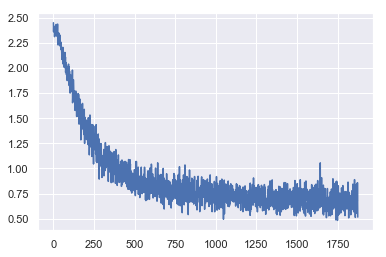

Accuracy 0.598
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


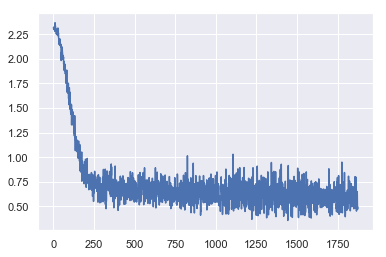

Accuracy 0.58
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


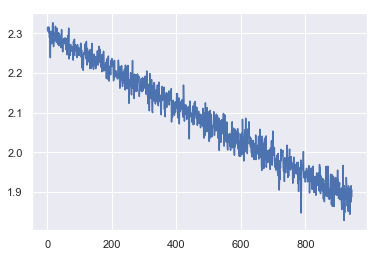

Accuracy 0.5585
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


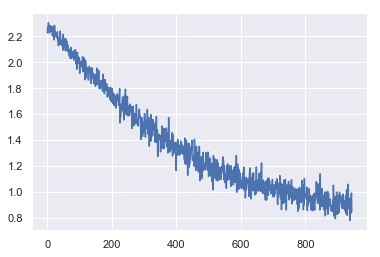

Accuracy 0.556
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


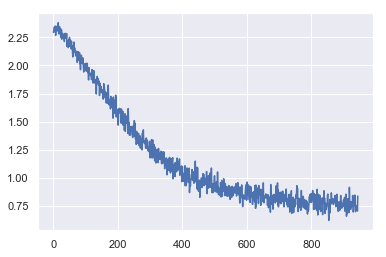

Accuracy 0.558
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


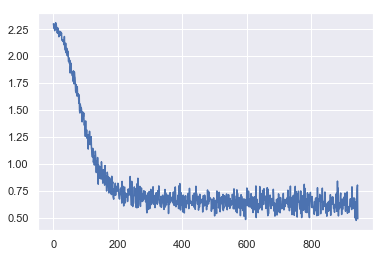

Accuracy 0.584
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


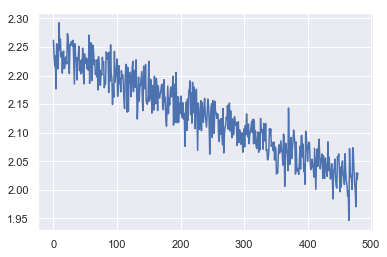

Accuracy 0.485
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


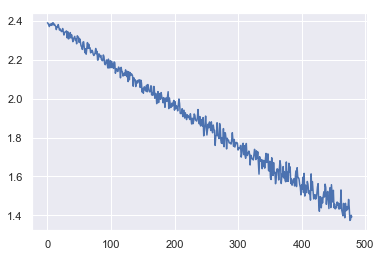

Accuracy 0.561
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


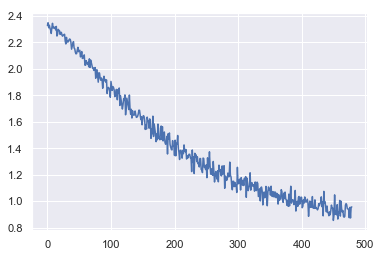

Accuracy 0.5725
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


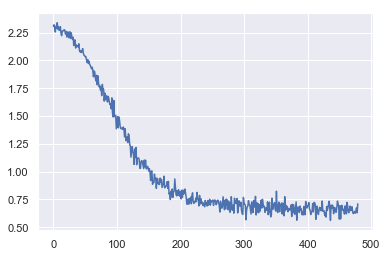

Accuracy 0.5855
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


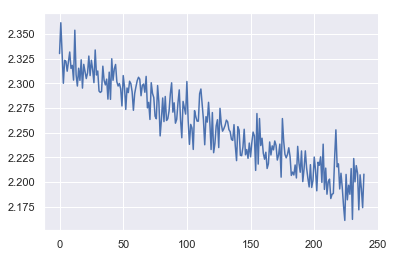

Accuracy 0.3335
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


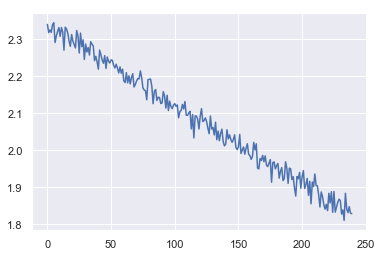

Accuracy 0.516
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


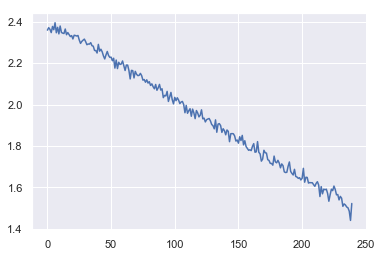

Accuracy 0.5265
Experiment {'epochs': 15, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


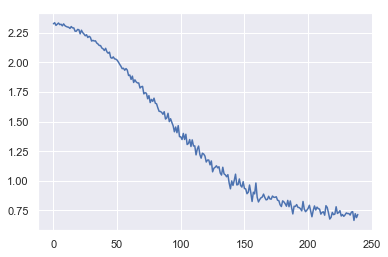

Accuracy 0.575
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


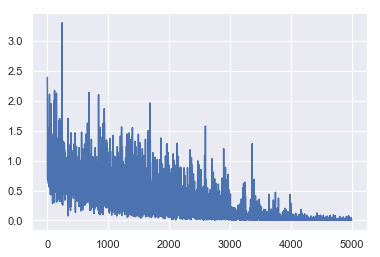

Accuracy 0.5935
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


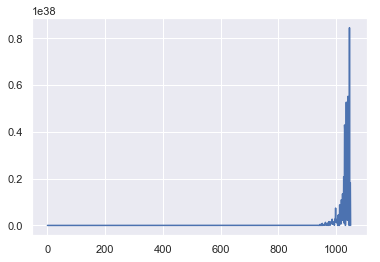

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


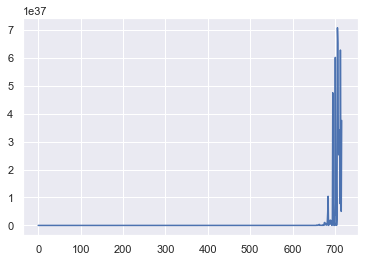

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


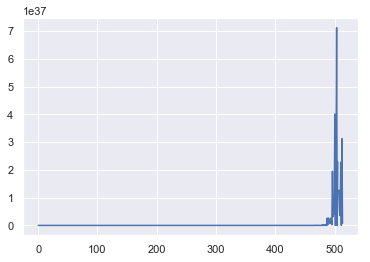

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


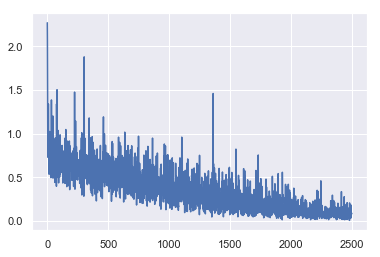

Accuracy 0.6025
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


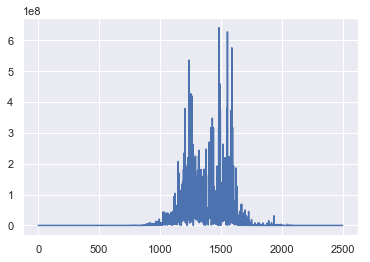

Accuracy 0.501
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


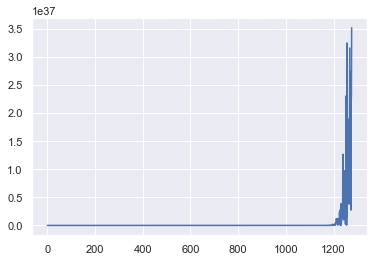

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


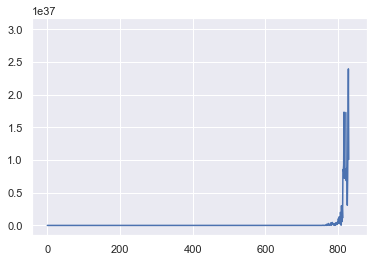

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


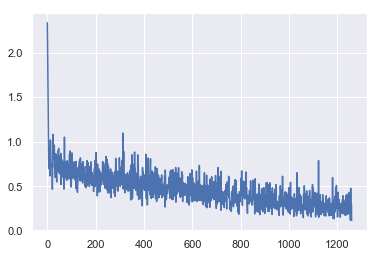

Accuracy 0.595
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


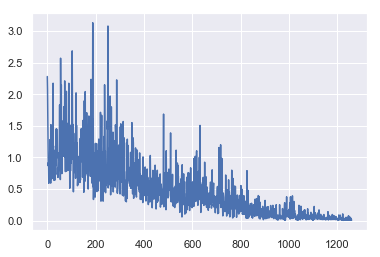

Accuracy 0.565
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


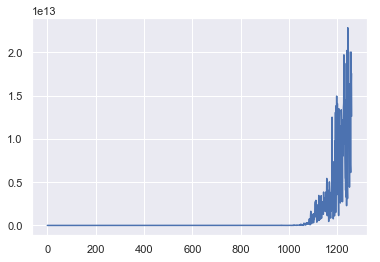

Accuracy 0.4645
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


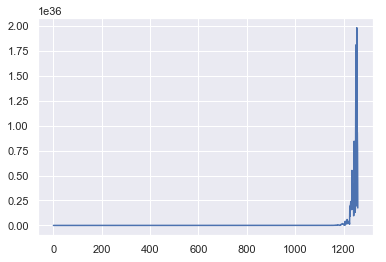

Accuracy 0.521
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


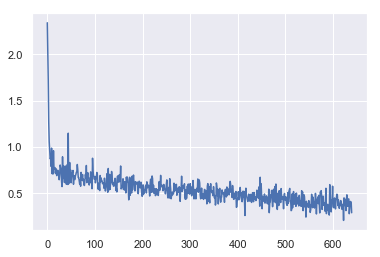

Accuracy 0.5905
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


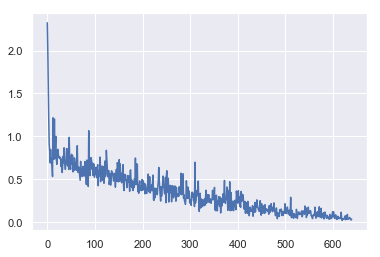

Accuracy 0.5975
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


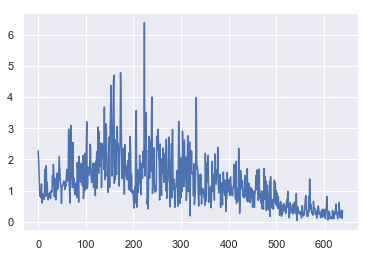

Accuracy 0.5445
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


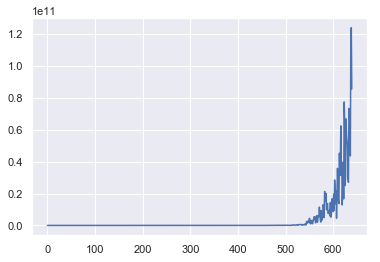

Accuracy 0.5075
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


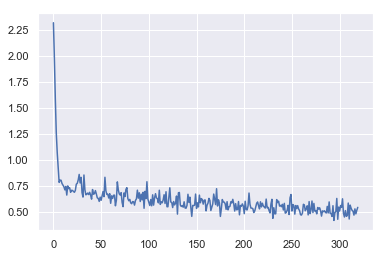

Accuracy 0.5725
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


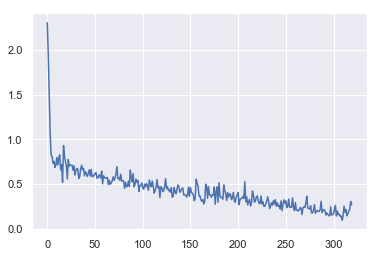

Accuracy 0.5995
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


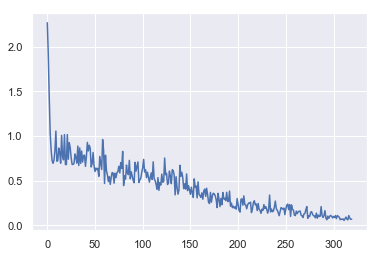

Accuracy 0.5815
Experiment {'epochs': 20, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


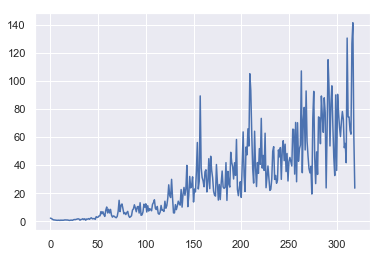

Accuracy 0.5305
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


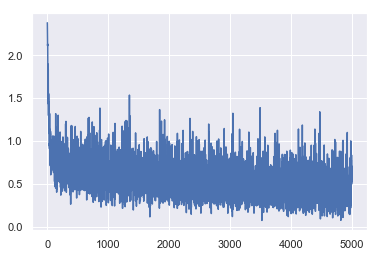

Accuracy 0.5935
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


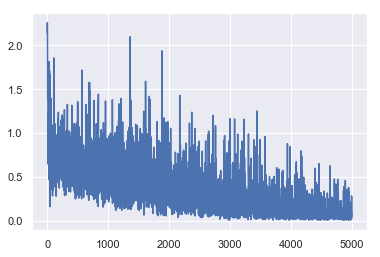

Accuracy 0.6055
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


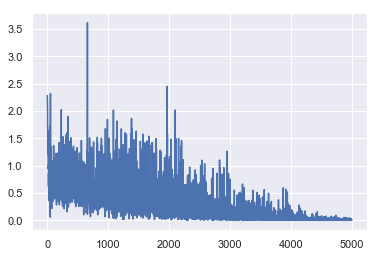

Accuracy 0.596
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


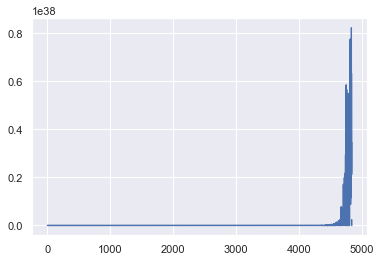

Accuracy 0.0
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


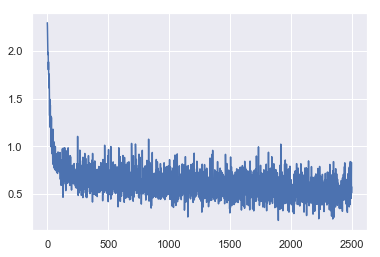

Accuracy 0.5925
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


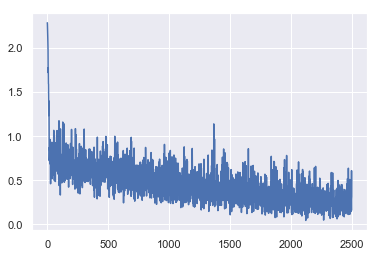

Accuracy 0.607
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


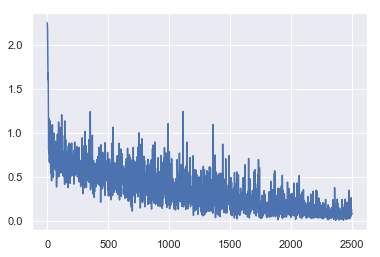

Accuracy 0.5845
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


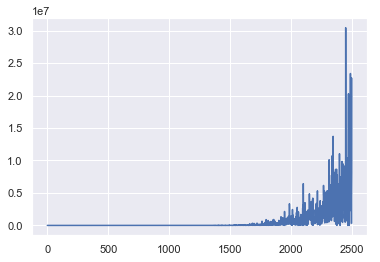

Accuracy 0.5305
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


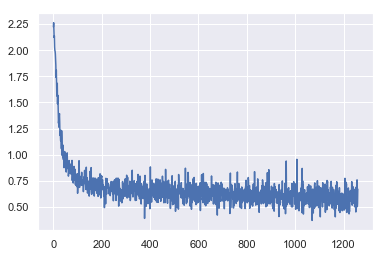

Accuracy 0.5935
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


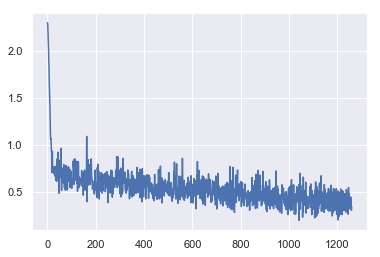

Accuracy 0.6045
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


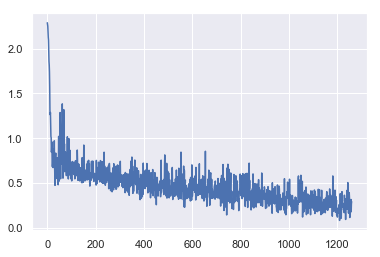

Accuracy 0.5775
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


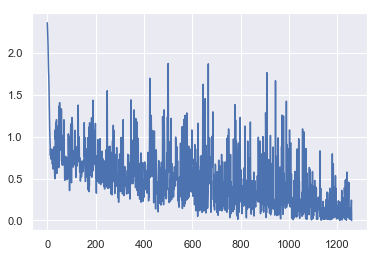

Accuracy 0.5735
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


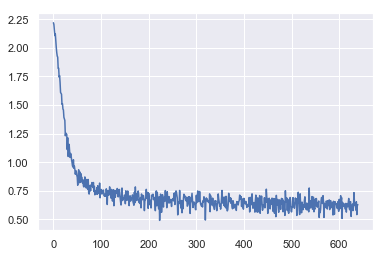

Accuracy 0.5935
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


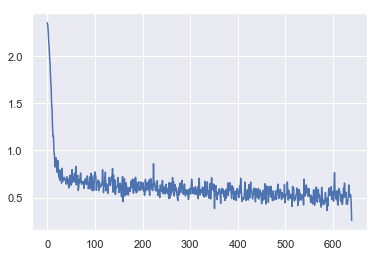

Accuracy 0.5805
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


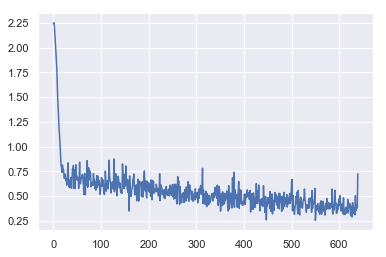

Accuracy 0.606
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


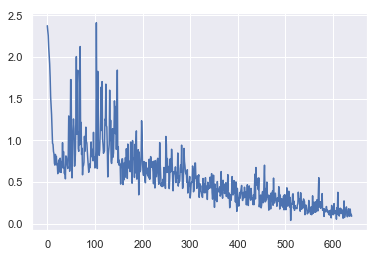

Accuracy 0.593
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


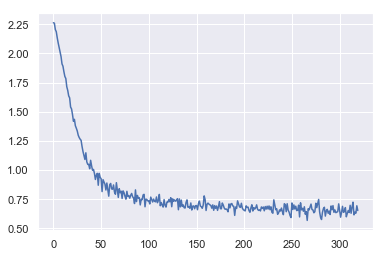

Accuracy 0.599
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


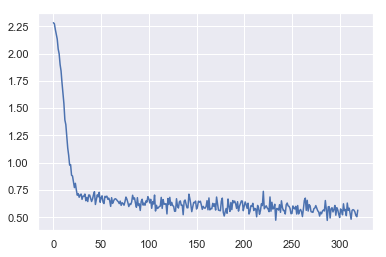

Accuracy 0.595
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


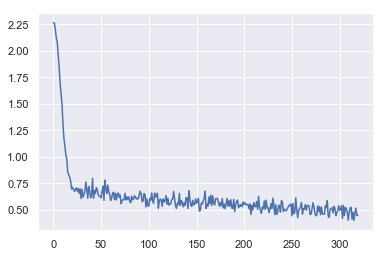

Accuracy 0.583
Experiment {'epochs': 20, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


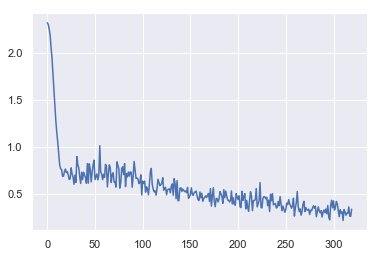

Accuracy 0.58
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


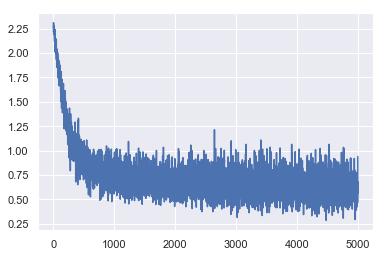

Accuracy 0.5915
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


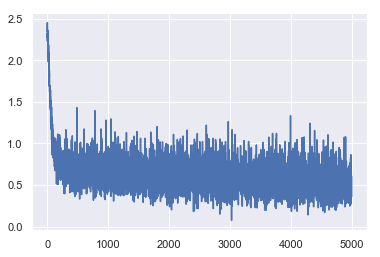

Accuracy 0.6015
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


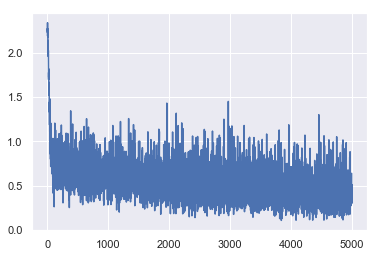

Accuracy 0.5715
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


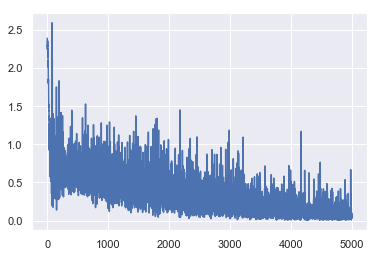

Accuracy 0.595
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


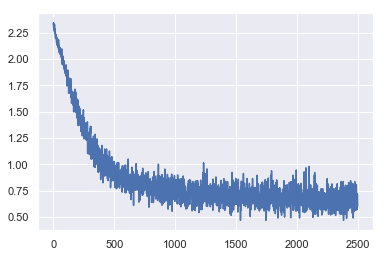

Accuracy 0.577
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


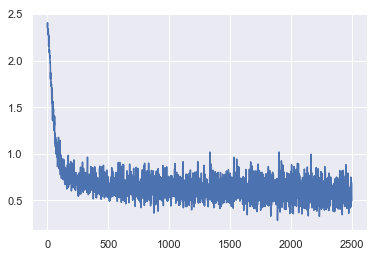

Accuracy 0.596
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


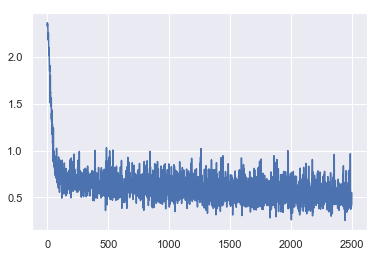

Accuracy 0.5885
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


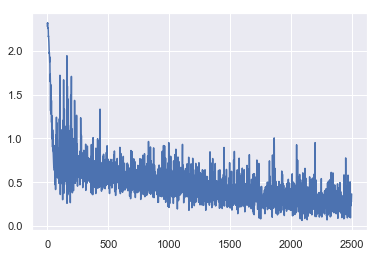

Accuracy 0.5925
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


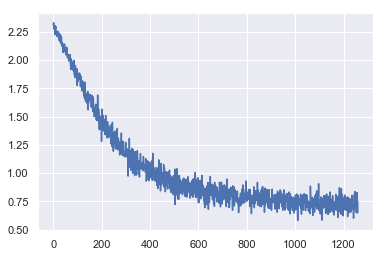

Accuracy 0.569
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


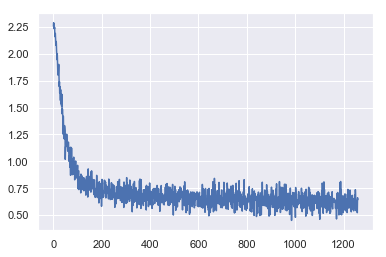

Accuracy 0.5945
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


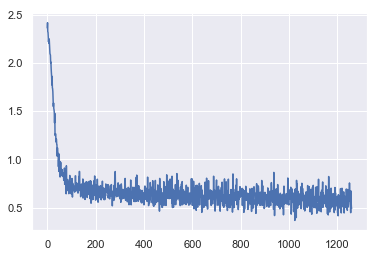

Accuracy 0.5975
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


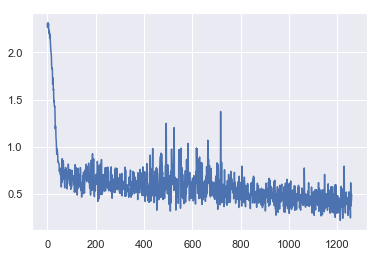

Accuracy 0.5975
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


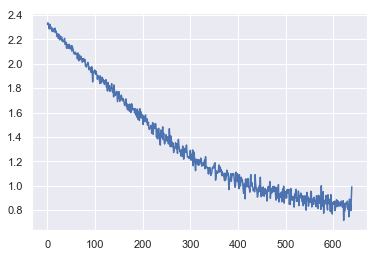

Accuracy 0.58
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


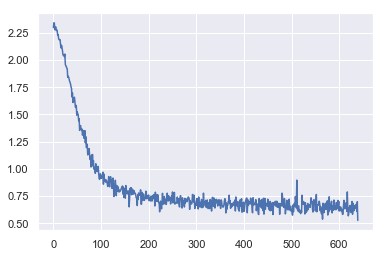

Accuracy 0.588
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


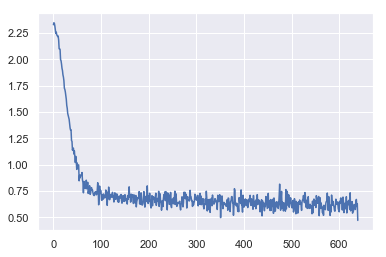

Accuracy 0.593
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


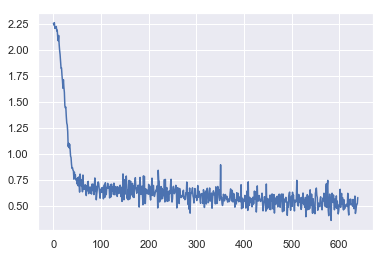

Accuracy 0.59
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


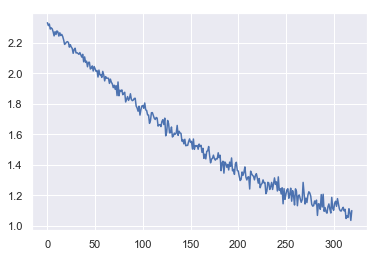

Accuracy 0.578
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


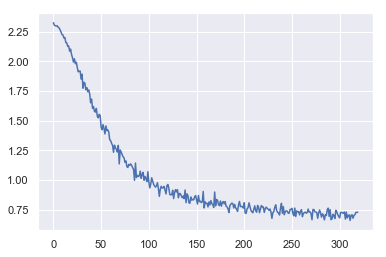

Accuracy 0.5735
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


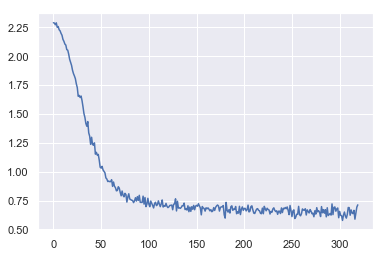

Accuracy 0.585
Experiment {'epochs': 20, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


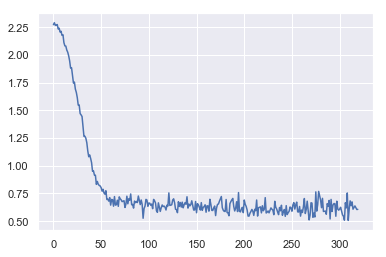

Accuracy 0.5555
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


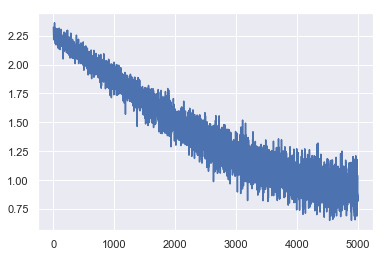

Accuracy 0.5575
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


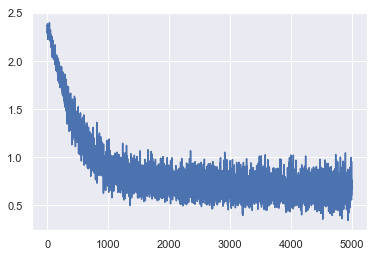

Accuracy 0.609
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


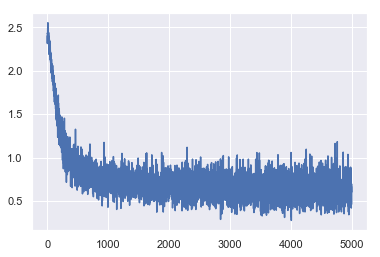

Accuracy 0.592
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


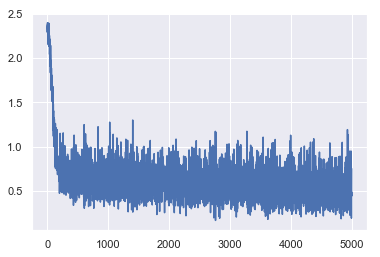

Accuracy 0.59
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


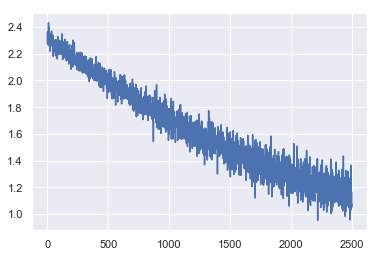

Accuracy 0.5765
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


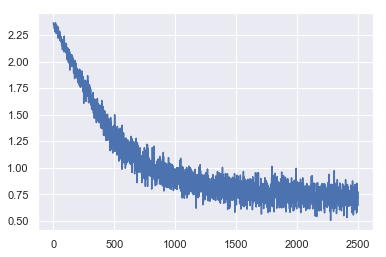

Accuracy 0.576
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


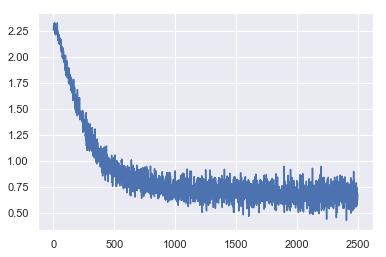

Accuracy 0.582
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


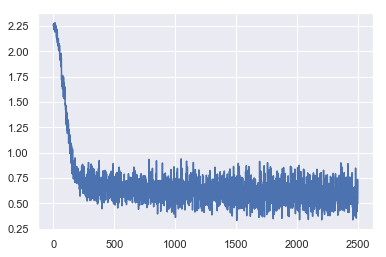

Accuracy 0.584
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


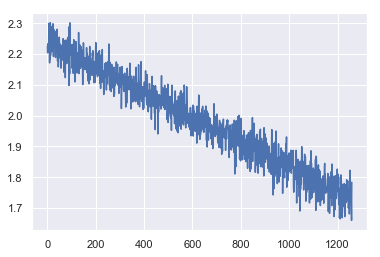

Accuracy 0.5295
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


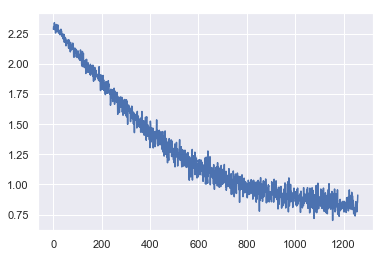

Accuracy 0.569
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


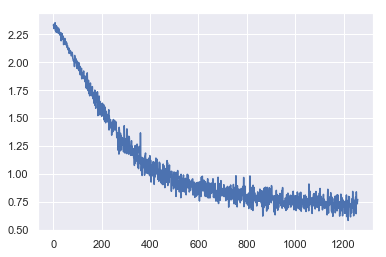

Accuracy 0.574
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


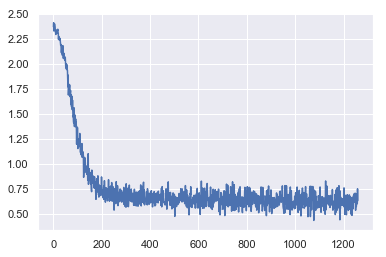

Accuracy 0.5835
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


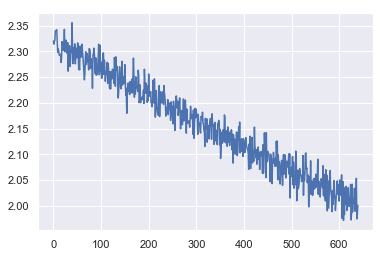

Accuracy 0.4875
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


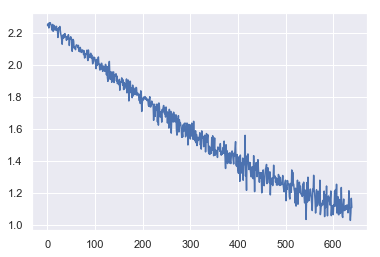

Accuracy 0.5695
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


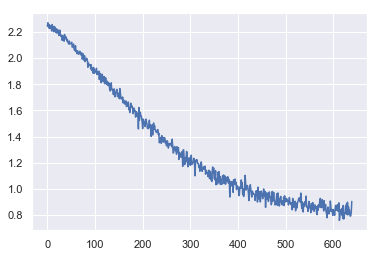

Accuracy 0.572
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


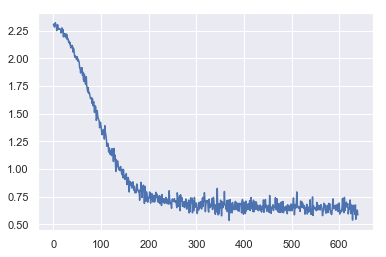

Accuracy 0.5945
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


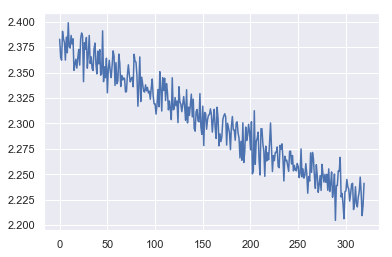

Accuracy 0.257
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


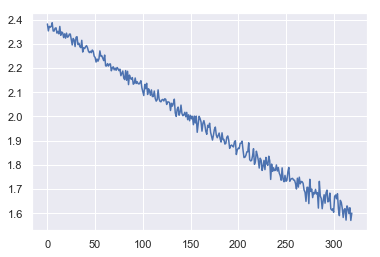

Accuracy 0.513
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


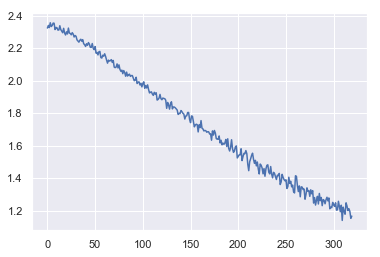

Accuracy 0.543
Experiment {'epochs': 20, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


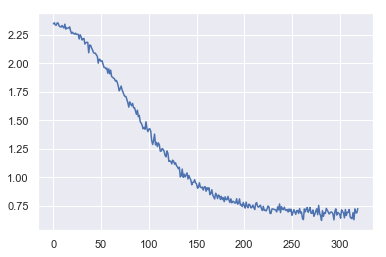

Accuracy 0.572
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.5}


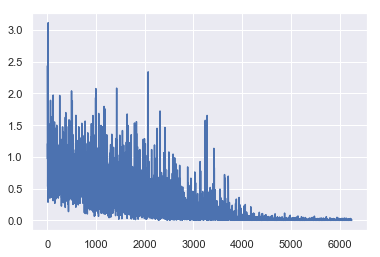

Accuracy 0.5895
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.9}


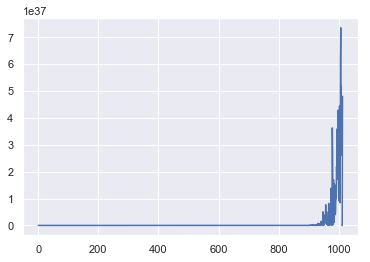

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.95}


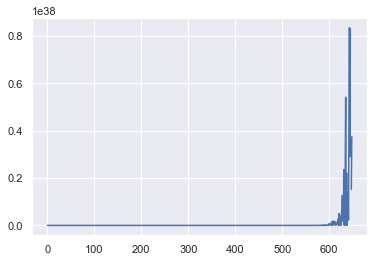

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 4, 'momentum': 0.99}


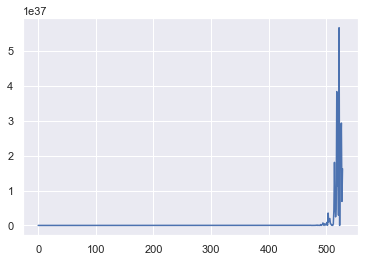

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.5}


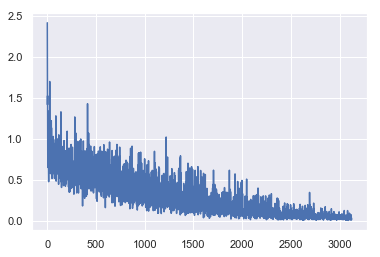

Accuracy 0.607
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.9}


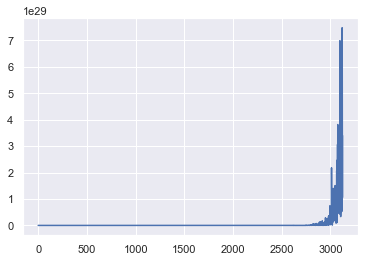

Accuracy 0.4945
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.95}


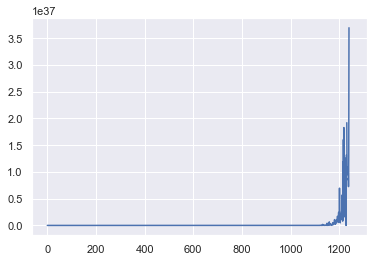

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 8, 'momentum': 0.99}


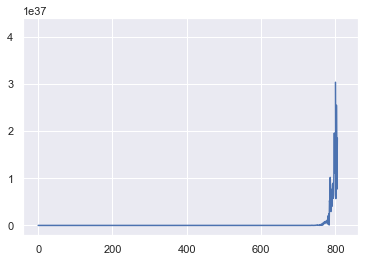

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}


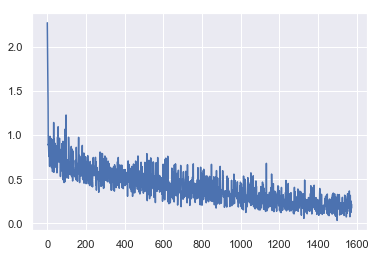

Accuracy 0.6075
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.9}


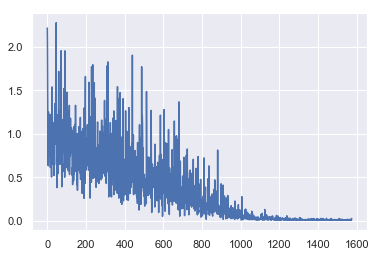

Accuracy 0.5775
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.95}


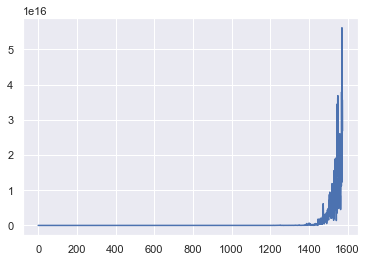

Accuracy 0.4825
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.99}


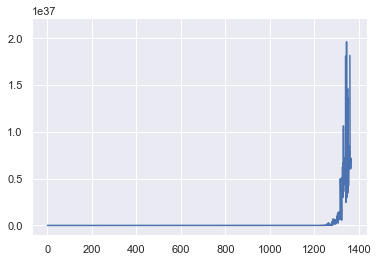

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.5}


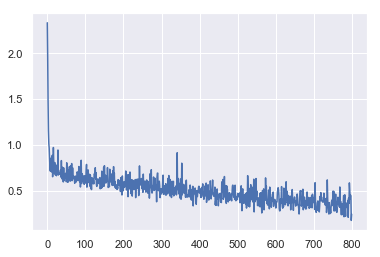

Accuracy 0.5925
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.9}


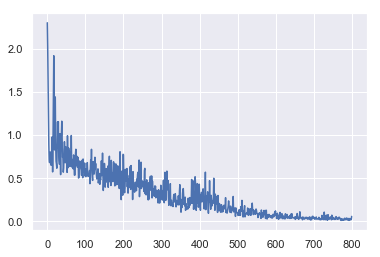

Accuracy 0.6025
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.95}


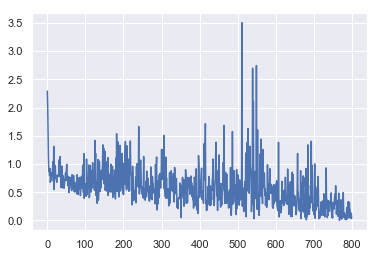

Accuracy 0.5815
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 32, 'momentum': 0.99}


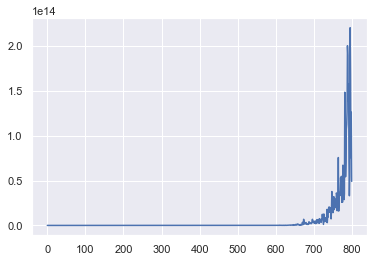

Accuracy 0.4865
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.5}


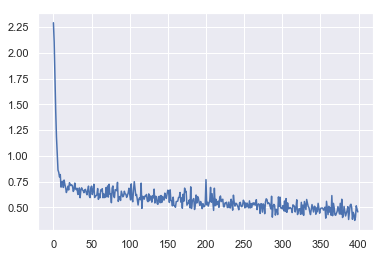

Accuracy 0.5915
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.9}


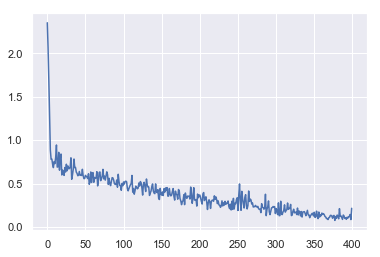

Accuracy 0.5945
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.95}


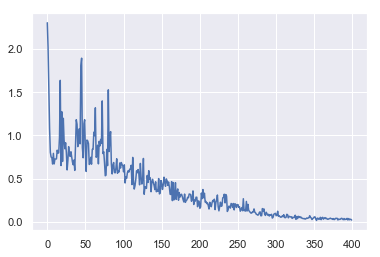

Accuracy 0.6065
Experiment {'epochs': 25, 'lr': 0.01, 'batch_size': 64, 'momentum': 0.99}


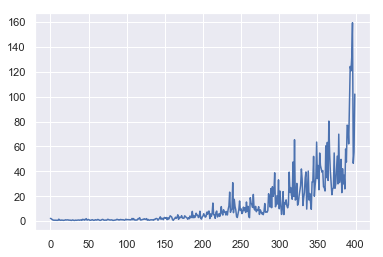

Accuracy 0.5475
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}


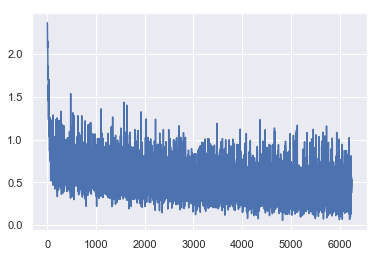

Accuracy 0.6105
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.9}


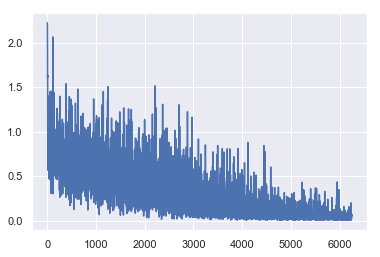

Accuracy 0.588
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.95}


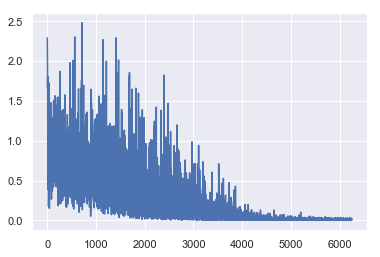

Accuracy 0.594
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.99}


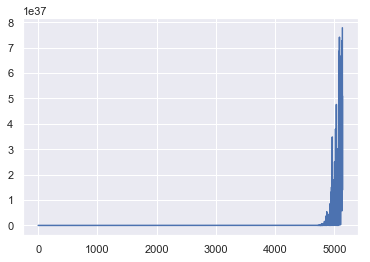

Accuracy 0.0
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.5}


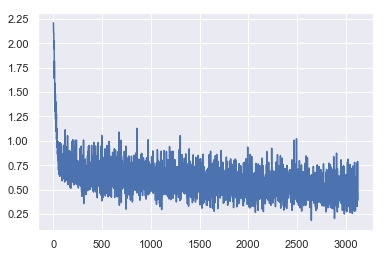

Accuracy 0.5835
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}


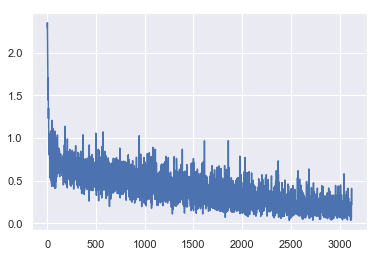

Accuracy 0.6085
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}


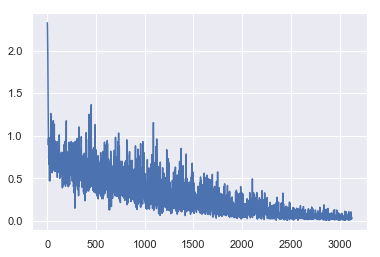

Accuracy 0.5995
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.99}


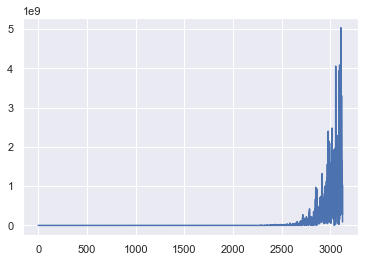

Accuracy 0.5405
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.5}


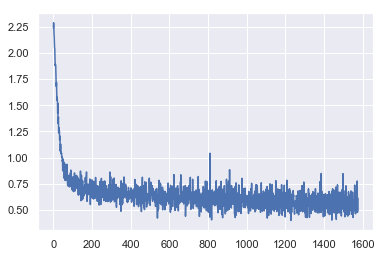

Accuracy 0.596
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}


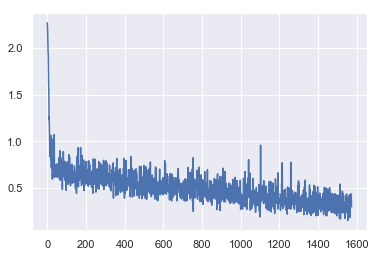

Accuracy 0.598
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.95}


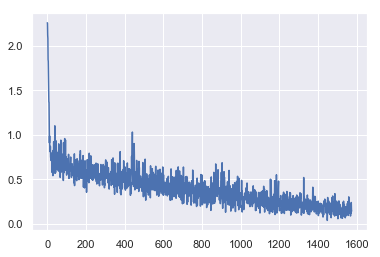

Accuracy 0.6055
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.99}


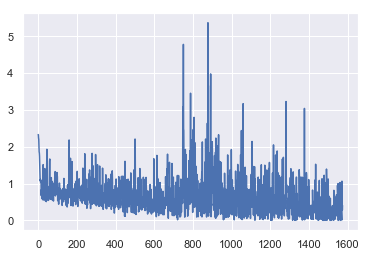

Accuracy 0.567
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.5}


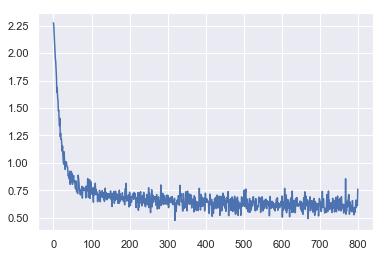

Accuracy 0.589
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.9}


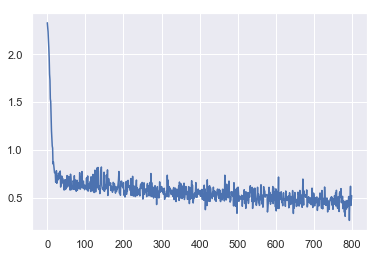

Accuracy 0.582
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.95}


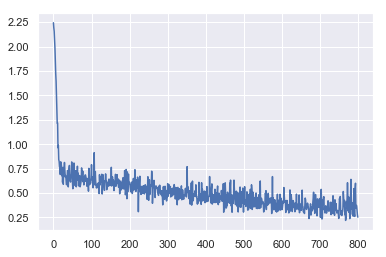

Accuracy 0.571
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 32, 'momentum': 0.99}


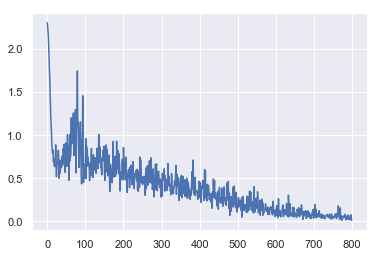

Accuracy 0.583
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.5}


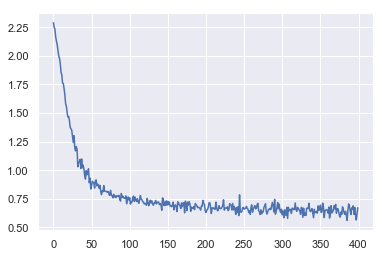

Accuracy 0.6
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.9}


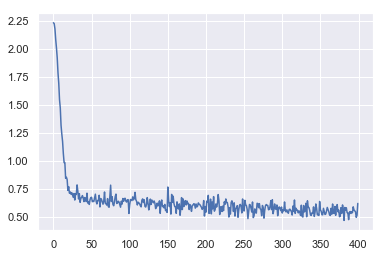

Accuracy 0.589
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.95}


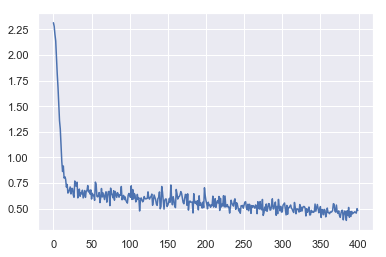

Accuracy 0.58
Experiment {'epochs': 25, 'lr': 0.001, 'batch_size': 64, 'momentum': 0.99}


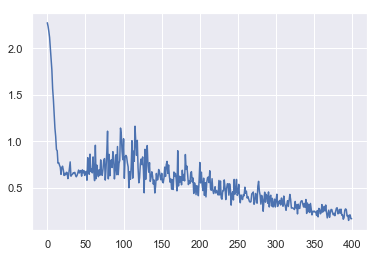

Accuracy 0.601
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.5}


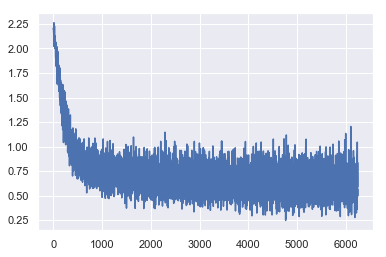

Accuracy 0.593
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}


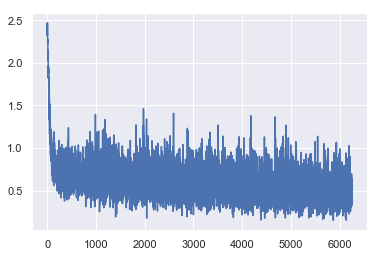

Accuracy 0.598
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.95}


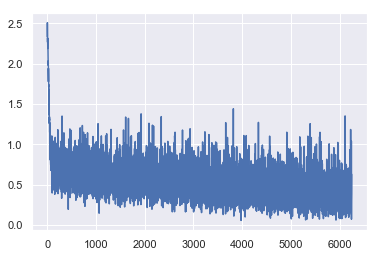

Accuracy 0.596
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.99}


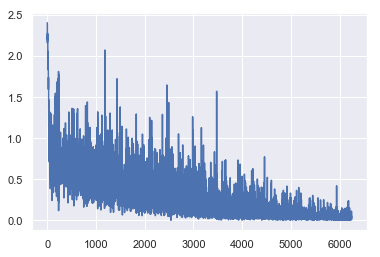

Accuracy 0.5815
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.5}


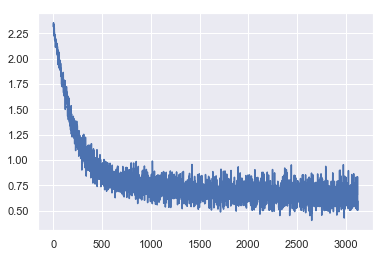

Accuracy 0.6025
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.9}


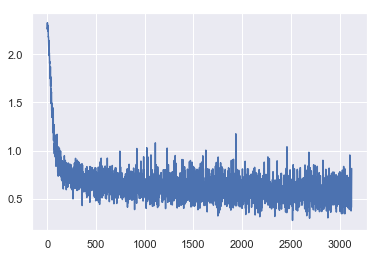

Accuracy 0.59
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.95}


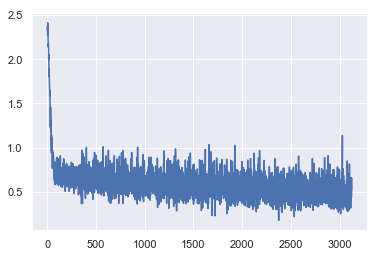

Accuracy 0.5845
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 8, 'momentum': 0.99}


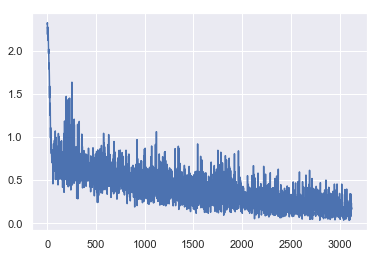

Accuracy 0.5835
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.5}


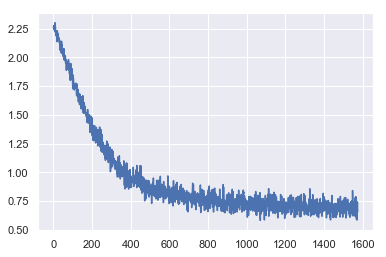

Accuracy 0.571
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.9}


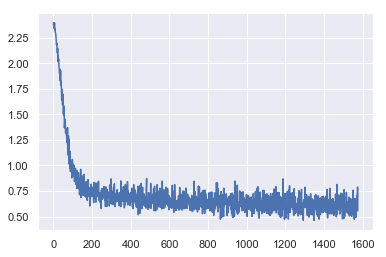

Accuracy 0.602
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.95}


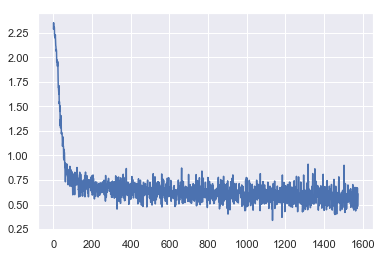

Accuracy 0.5975
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 16, 'momentum': 0.99}


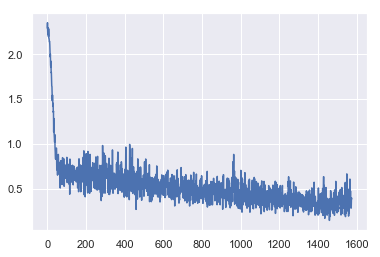

Accuracy 0.587
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.5}


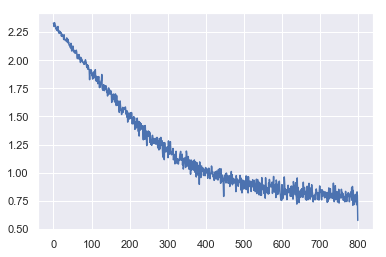

Accuracy 0.567
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.9}


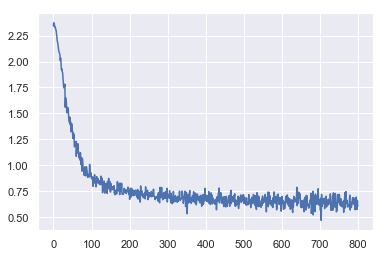

Accuracy 0.594
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.95}


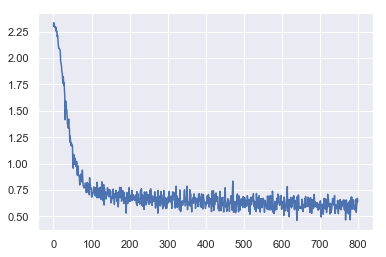

Accuracy 0.565
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 32, 'momentum': 0.99}


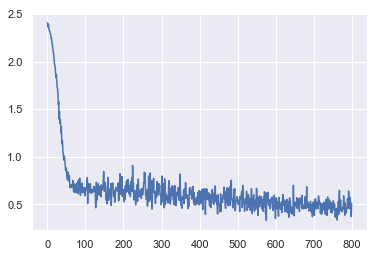

Accuracy 0.585
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.5}


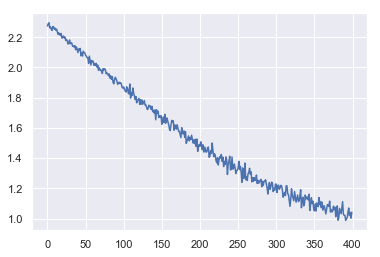

Accuracy 0.552
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.9}


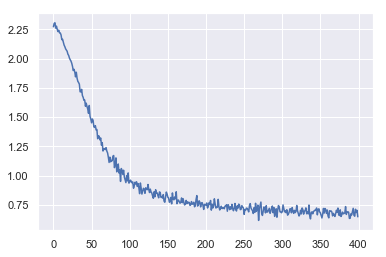

Accuracy 0.581
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.95}


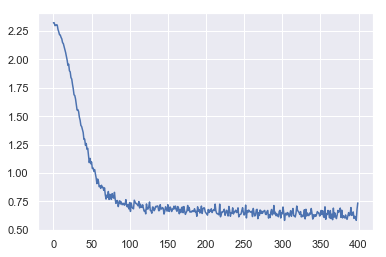

Accuracy 0.583
Experiment {'epochs': 25, 'lr': 0.0001, 'batch_size': 64, 'momentum': 0.99}


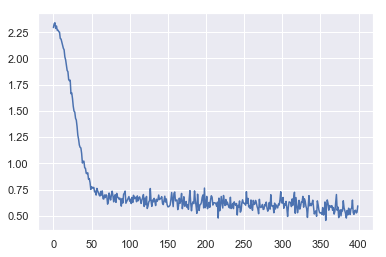

Accuracy 0.5945
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.5}


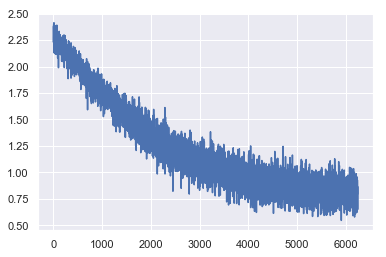

Accuracy 0.577
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}


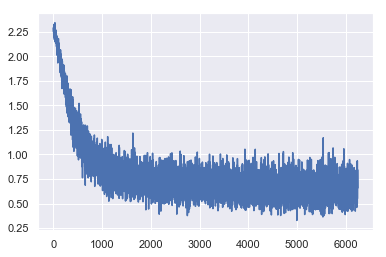

Accuracy 0.607
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}


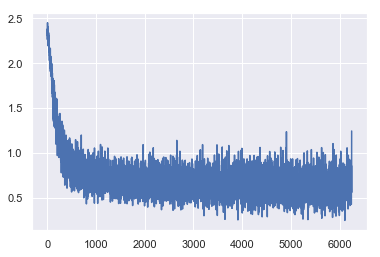

Accuracy 0.601
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.99}


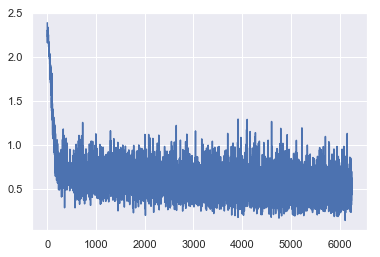

Accuracy 0.5945
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.5}


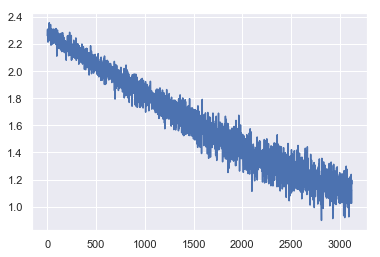

Accuracy 0.559
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.9}


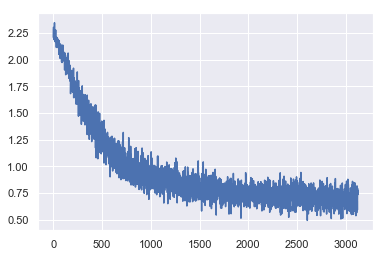

Accuracy 0.5835
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.95}


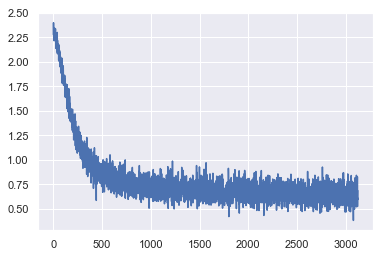

Accuracy 0.588
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 8, 'momentum': 0.99}


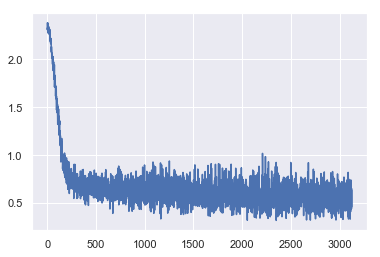

Accuracy 0.593
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.5}


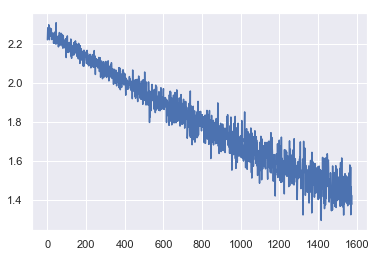

Accuracy 0.552
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.9}


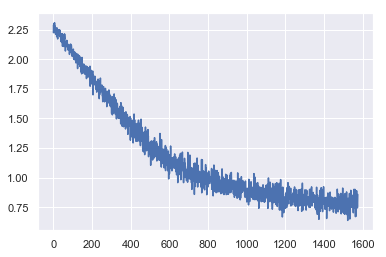

Accuracy 0.5685
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.95}


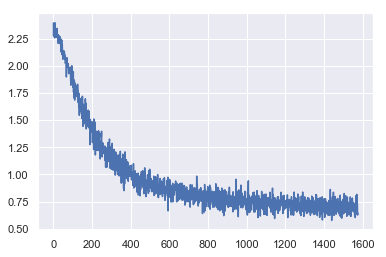

Accuracy 0.582
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 16, 'momentum': 0.99}


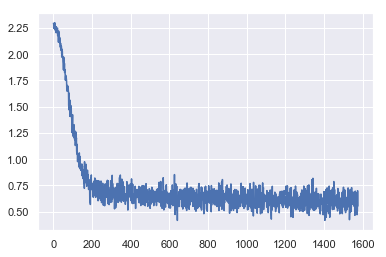

Accuracy 0.579
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.5}


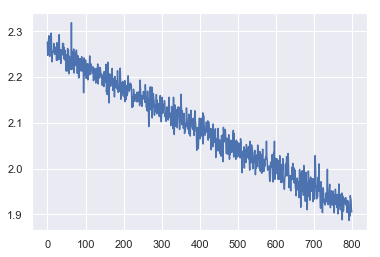

Accuracy 0.5135
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.9}


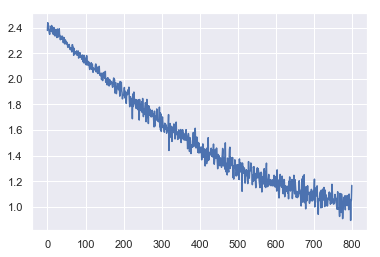

Accuracy 0.5585
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.95}


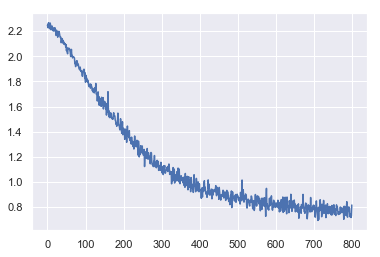

Accuracy 0.567
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 32, 'momentum': 0.99}


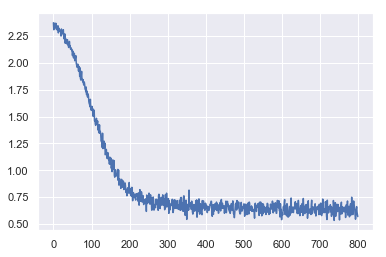

Accuracy 0.595
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.5}


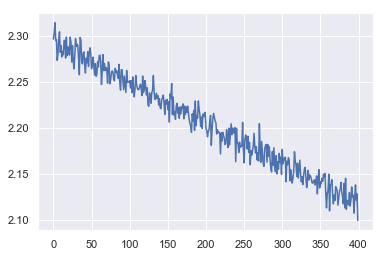

Accuracy 0.4845
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.9}


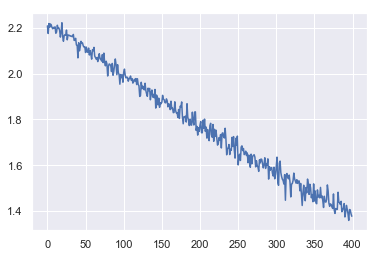

Accuracy 0.5205
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.95}


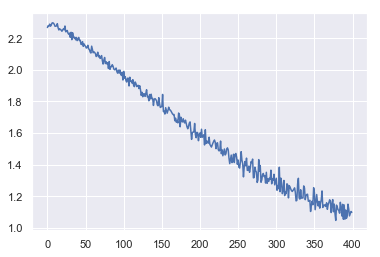

Accuracy 0.572
Experiment {'epochs': 25, 'lr': 1e-05, 'batch_size': 64, 'momentum': 0.99}


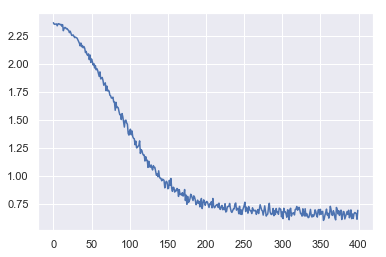

Accuracy 0.5875


In [46]:
experiment_logs = list()
for e in epochs_space:
    for l in lr_space:
        for b in batch_size_space:
            for m in momentum_space:
                cnn_config = {"epochs": e, "lr": l, "batch_size": b, "momentum": m}
                print("Experiment", str(cnn_config))
                accuracy = cnn_train_test(SimpleCNN32Filter, train_labels, test_labels, 0.1, cnn_config, 3, 5)
                print("Accuracy", accuracy)
                
                experiment_logs.append((accuracy, cnn_config))

In [47]:
np.save("grid_search_best_cnn_params_single_32_filters.npy", np.array(experiment_logs))

In [49]:
saved_experiment_logs = np.load("grid_search_best_cnn_params_single_32_filters.npy")

In [53]:
sorted_experiment_logs = sorted(saved_experiment_logs, key=lambda x: x[0], reverse=True)

In [54]:
import pprint
pp = pprint.PrettyPrinter(depth=6)
pp.pprint(sorted_experiment_logs[:20])

[array([0.6115,
       {'epochs': 15, 'lr': 0.001, 'batch_size': 16, 'momentum': 0.9}],
      dtype=object),
 array([0.6105,
       {'epochs': 10, 'lr': 0.0001, 'batch_size': 4, 'momentum': 0.9}],
      dtype=object),
 array([0.6105,
       {'epochs': 15, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}],
      dtype=object),
 array([0.6105,
       {'epochs': 25, 'lr': 0.001, 'batch_size': 4, 'momentum': 0.5}],
      dtype=object),
 array([0.61,
       {'epochs': 5, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.95}],
      dtype=object),
 array([0.6095,
       {'epochs': 15, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.95}],
      dtype=object),
 array([0.609,
       {'epochs': 20, 'lr': 1e-05, 'batch_size': 4, 'momentum': 0.9}],
      dtype=object),
 array([0.6085,
       {'epochs': 25, 'lr': 0.001, 'batch_size': 8, 'momentum': 0.9}],
      dtype=object),
 array([0.6075,
       {'epochs': 25, 'lr': 0.01, 'batch_size': 16, 'momentum': 0.5}],
      dtype=object),
 array([0.607,
       {'epoc